In [1]:
%load_ext autoreload
%autoreload 2

## Preamble

In [2]:
import numpy as np

In [3]:
from matplotlib import rcParams
import matplotlib.pyplot as plt
import matplotlib.ticker as pltt

In [4]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MaxAbsScaler
from sklearn.model_selection import train_test_split

import tensorflow as tf

In [5]:
from utils import Example2D, NamedFunc, MonomialFeatures, roughplot2D, step, evolve, SaveBest, EpochProgbar, animatedplot2D
from evaluate import evaluate2D
from models import SymmetricRidge, tfNSymmetricBuiltin_Regressor, tfNSymmetricBuiltin_NormRegressor

In [6]:
rcParams['font.family'] = 'serif'
rcParams['font.size'] = 24
rcParams["mathtext.fontset"]  = 'dejavuserif'

### Data

In [7]:
mat1 = Example2D("plate/plate_1_20_20")

In [8]:
mat2 = Example2D("plate/plate_2_20_20")

## Overview

### Hyperelastic

#### Displacements

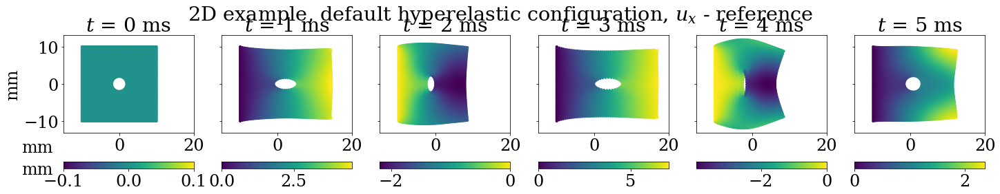

In [8]:
roughplot2D(mat1.dx,mat1.x,mat1.y)
plt.suptitle(r"2D example, default hyperelastic configuration, $u_x$ - reference", y=0.85);
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

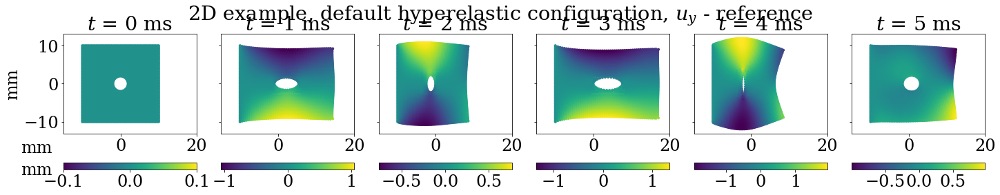

In [9]:
roughplot2D(mat1.dy,mat1.x,mat1.y)
plt.suptitle(r"2D example, default hyperelastic configuration, $u_y$ - reference", y=0.85);
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

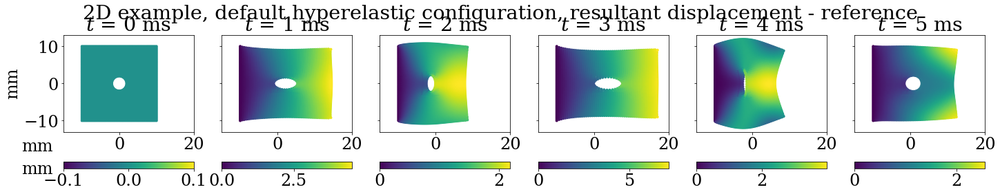

In [10]:
roughplot2D(np.sqrt(mat1.dy**2+mat1.dx**2),mat1.x,mat1.y)
plt.suptitle(r"2D example, default hyperelastic configuration, resultant displacement - reference", y=0.85);
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

'Saved to ../animations/hyperelastic_reference.gif'

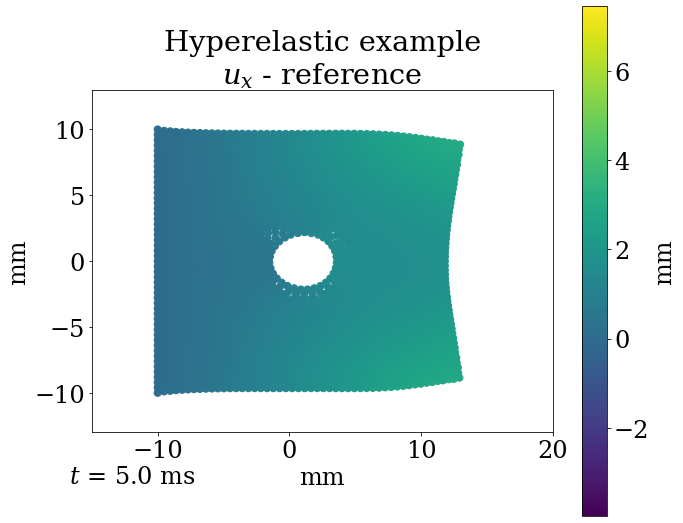

In [43]:
animatedplot2D(mat1.dx,mat1.x,mat1.y,
               path = "../animations/hyperelastic_reference",
               title = "Hyperelastic example\n$u_x$ - reference",
               total_frames=100)

#### POD components

In [11]:
pod_basis_size = 6
mat1.reduce_components(pod_basis_size)

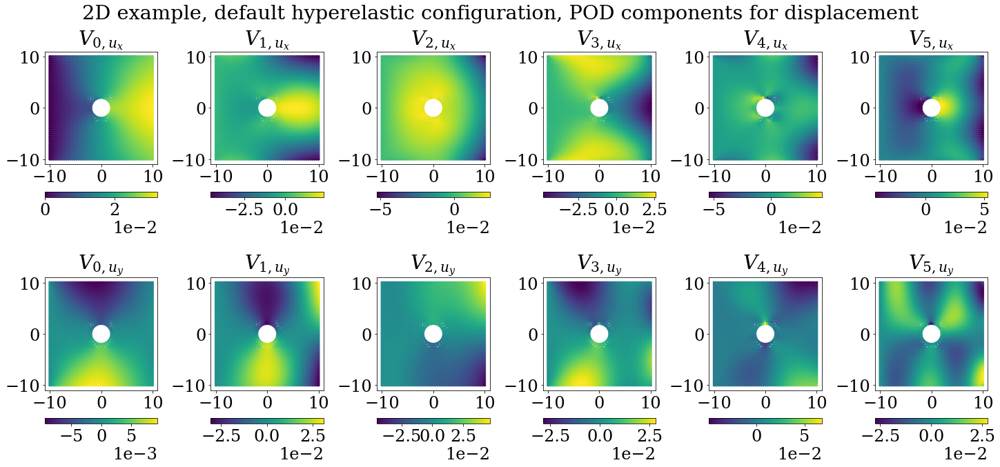

In [12]:
plt.figure(figsize=(20,9.5))
for i in range(6):
    plt.subplot(2,6,i+1)
    plt.scatter(mat1.x[0],mat1.y[0],c=mat1.pod.components_[i,:int(mat1.pod.n_features_in_/2)],s=10)
    plt.gca().set_aspect('equal')
    cb = plt.colorbar(location='bottom')
    cb.formatter.set_powerlimits((0, 0))
    plt.title(rf"$V_{{{i},u_x}}$")
    plt.subplot(2,6,i+7)
    plt.scatter(mat1.x[0],mat1.y[0],c=mat1.pod.components_[i,int(mat1.pod.n_features_in_/2):],s=10)
    plt.gca().set_aspect('equal')
    cb = plt.colorbar(location='bottom')
    cb.formatter.set_powerlimits((0, 0))
    plt.title(rf"$V_{{{i},u_y}}$")
plt.suptitle(r"2D example, default hyperelastic configuration, POD components for displacement");
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

In [13]:
pod_basis_size = 20
mat1.reduce_components(pod_basis_size)
pod_ratios = mat1.estimate_SVD_fit(pod_basis_size, mat1.V, mat1.dd)


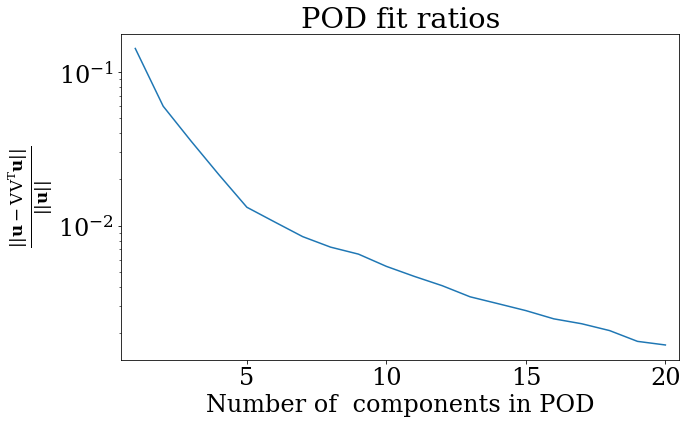

In [14]:
plt.figure(figsize=(10,6))
plt.semilogy(range(1,pod_basis_size+1), pod_ratios)
plt.xlim([0.5,pod_basis_size+0.5])
#plt.gca().xaxis.set_major_locator(pltt.MultipleLocator(1))
plt.ylabel(r'$\frac{\|\|\mathbf{u}-\mathrm{VV^T}\mathbf{u}\|\|}{\|\|\mathbf{u}\|\|}$')
plt.xlabel('Number of  components in POD')
plt.title(f"POD fit ratios");

### Plastic

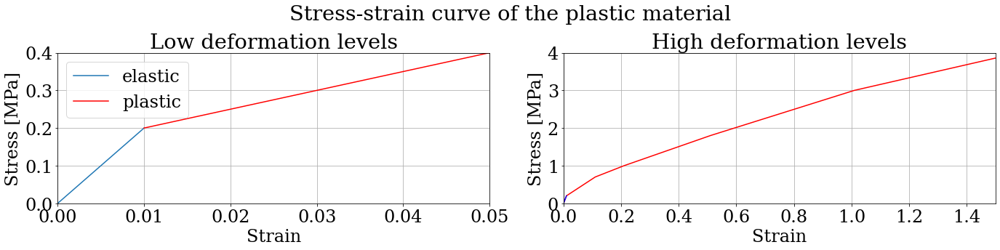

In [56]:
E = 0.02*1000
ESs = np.array([2e-4, 7e-4, 0.001, 0.0018, 0.003, 0.01])*1000
EPSs = np.array([0, 0.1, 0.2, 0.5, 1.0, 5.0])
yield_strain = ESs[0]/E
x = np.hstack([np.zeros(1), EPSs+yield_strain])
y =np.hstack([np.zeros(1), ESs])
plt.figure(figsize=(20,5.5))
plt.subplot(121)
plt.plot(x[:2],y[:2],label='elastic')
plt.plot(x[1:3],y[1:3],'red',label='plastic')
plt.legend()
plt.xlim(0,0.05)
plt.ylim(0,0.4)
plt.xlabel('Strain')
plt.ylabel("Stress [MPa]")
plt.title("Low deformation levels")
plt.grid()
plt.subplot(122)
plt.plot(x,y,'red')
plt.plot(x[:2],y[:2],'blue')
plt.xlim(0,1.5)
plt.ylim(0,4)
plt.xlabel('Strain')
plt.ylabel("Stress [MPa]")
plt.title("High deformation levels")
plt.grid()
plt.suptitle('Stress-strain curve of the plastic material', y=0.9)
plt.tight_layout()

#### Displacements

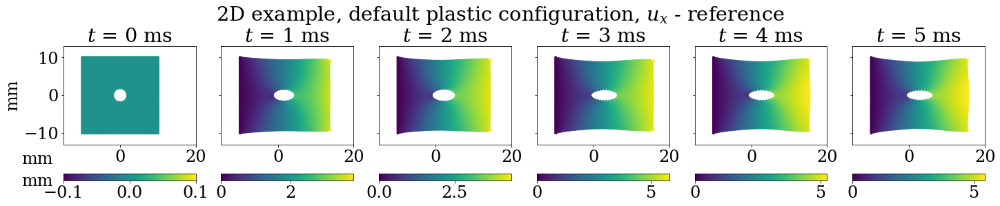

In [76]:
roughplot2D(mat2.dx,mat2.x,mat2.y)
plt.suptitle(r"2D example, default plastic configuration, $u_x$ - reference", y=0.9);
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

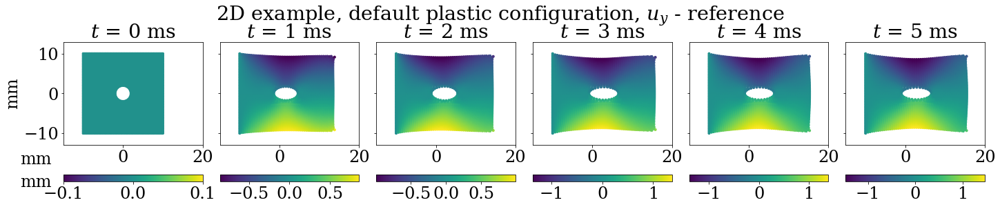

In [85]:
roughplot2D(mat2.dy,mat2.x,mat2.y)
plt.suptitle(r"2D example, default plastic configuration, $u_y$ - reference", y=0.9);
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

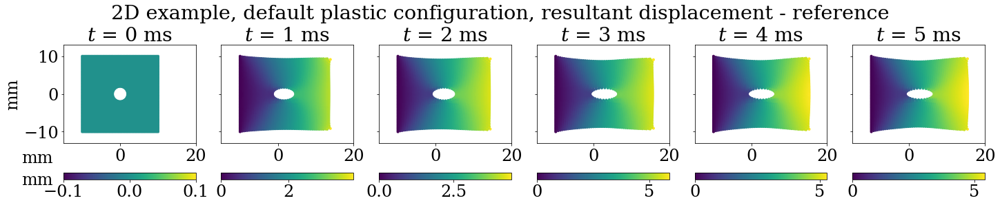

In [80]:
roughplot2D(np.sqrt(mat2.dy**2+mat2.dx**2),mat2.x,mat2.y)
plt.suptitle(r"2D example, default plastic configuration, resultant displacement - reference", y=0.9);
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

'Saved to ../animations/plastic_reference.gif'

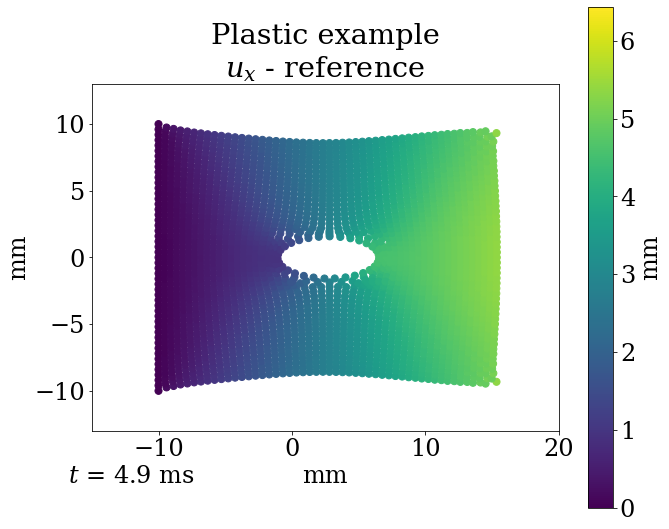

In [44]:
animatedplot2D(mat2.dx,mat2.x,mat2.y,
               path = "../animations/plastic_reference",
               title = "Plastic example\n$u_x$ - reference")

#### POD components - displacement

In [81]:
pod_basis_size = 6
mat2.reduce_components(pod_basis_size)

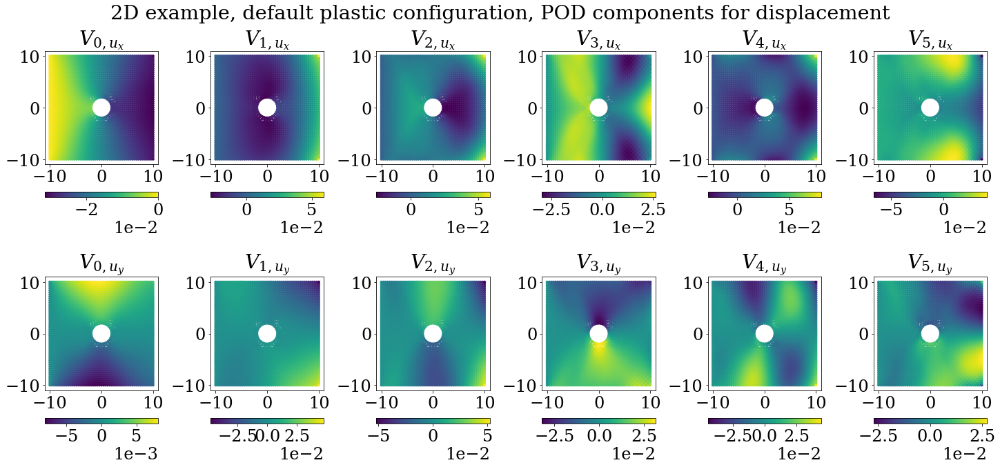

In [82]:
plt.figure(figsize=(20,9.5))
for i in range(6):
    plt.subplot(2,6,i+1)
    plt.scatter(mat2.x[0],mat2.y[0],c=mat2.pod.components_[i,:int(mat2.pod.n_features_in_/2)],s=10)
    plt.gca().set_aspect('equal')
    cb = plt.colorbar(location='bottom')
    cb.formatter.set_powerlimits((0, 0))
    plt.title(rf"$V_{{{i},u_x}}$")
    plt.subplot(2,6,i+7)
    plt.scatter(mat2.x[0],mat2.y[0],c=mat2.pod.components_[i,int(mat2.pod.n_features_in_/2):],s=10)
    plt.gca().set_aspect('equal')
    cb = plt.colorbar(location='bottom')
    cb.formatter.set_powerlimits((0, 0))
    plt.title(rf"$V_{{{i},u_y}}$")
plt.suptitle(r"2D example, default plastic configuration, POD components for displacement");
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

In [83]:
pod_basis_size = 20
mat2.reduce_components(pod_basis_size)
pod_ratios = mat2.estimate_SVD_fit(pod_basis_size, mat2.V, mat2.dd)


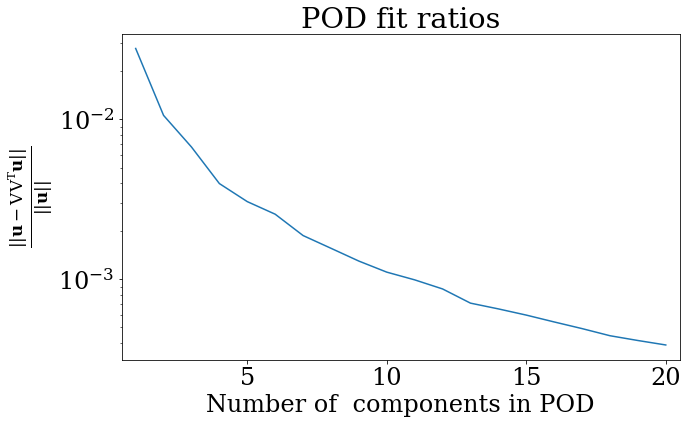

In [84]:
plt.figure(figsize=(10,6))
plt.semilogy(range(1,pod_basis_size+1), pod_ratios)
plt.xlim([0.5,pod_basis_size+0.5])
#plt.gca().xaxis.set_major_locator(pltt.MultipleLocator(1))
plt.ylabel(r'$\frac{\|\|\mathbf{u}-\mathrm{VV^T}\mathbf{u}\|\|}{\|\|\mathbf{u}\|\|}$')
plt.xlabel('Number of  components in POD')
plt.title(f"POD fit ratios");

#### POD components - plastic deformation

In [7]:
pod_basis_size = 6
mat2.reduce_components(pod_basis_size, to_reduce='eps', decomposable='self.pepspeps')

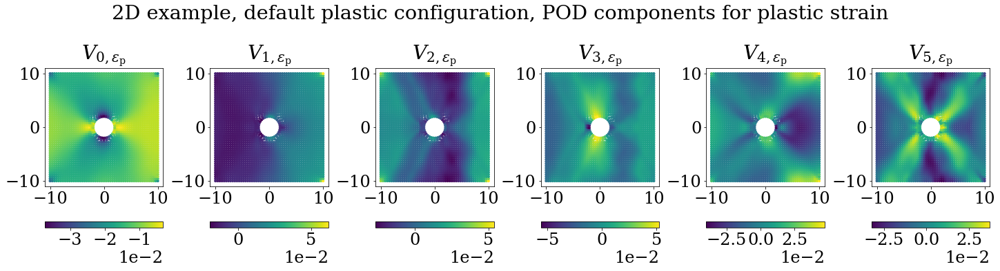

In [8]:
plt.figure(figsize=(20,5.5))
for i in range(6):
    plt.subplot(1,6,i+1)
    plt.scatter(mat2.x[0],mat2.y[0],c=mat2.pod.components_[i,:int(mat2.pod.n_features_in_/2)],s=10)
    plt.gca().set_aspect('equal')
    cb = plt.colorbar(location='bottom')
    cb.formatter.set_powerlimits((0, 0))
    plt.title(r"$V_{" + str(i) + ",\epsilon_{\mathrm{p}}}$")
plt.suptitle(r"2D example, default plastic configuration, POD components for plastic strain");
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1);

## Regression models

### Helper functions

In [9]:
def dr_trainfunc_base(mat,stop=501):
    return mat.xr[:stop] - mat.xr[0], mat.fint_r[:stop]

dr_trainfunc = NamedFunc(dr_trainfunc_base,'Reduced displacement')

def dr_ar_predfunc_base(i,x,v,mat,model,Mrinv,hist): 
    try:
            fint_r_pred = model.predict((x.reshape(1,-1)-mat.xr[0]).reshape(1,-1))
    except ValueError as e:
            print(f"ValueError during prediction at i={i}: '{e}'.\nPredicting a=0 instead.")
            fint_r_pred = mat.far[i]
    fr = mat.far[i]
    ar_pred = Mrinv @  (fr - fint_r_pred).T
    return ar_pred.T

dr_ar_predfunc = NamedFunc(dr_ar_predfunc_base, 'Prediction from displacement')

def dr_arinterp_predfunc_base(i,x,v,mat,model,Mrinv,hist): 
    try:
            fint_r_pred = model.predict((x.reshape(1,-1)-mat.xr[0]).reshape(1,-1))
    except ValueError as e:
            print(f"ValueError during prediction at i={i}: '{e}'.\nPredicting a=0 instead.")
            fint_r_pred = mat.far_interp(i*hist.dt)
    fr = mat.far_interp(i*hist.dt)
    ar_pred = Mrinv @  (fr - fint_r_pred).T
    return ar_pred.T

dr_arinterp_predfunc = NamedFunc(dr_arinterp_predfunc_base, 'Prediction from displacement with interpolation of applied force')

### Linear Regression

In [10]:
ridge = Ridge(alpha=0)

#### Non-symmetric, non-regularized, 4 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Ridge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	4
	Training range:	0:501/501


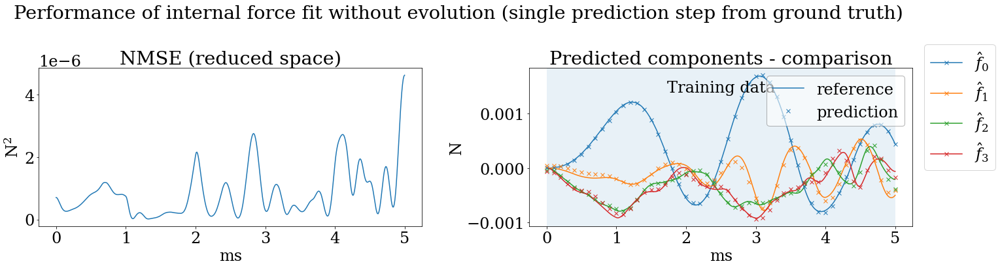

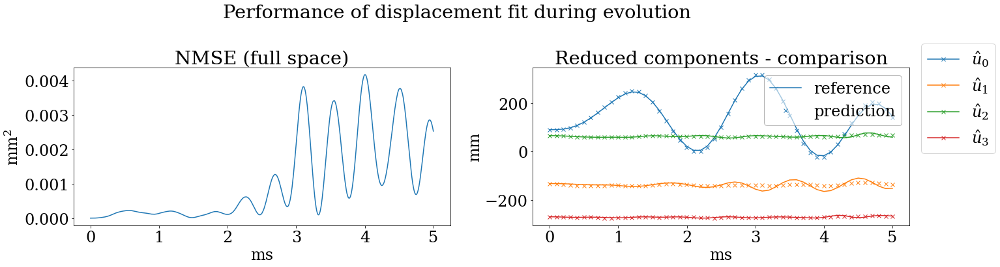

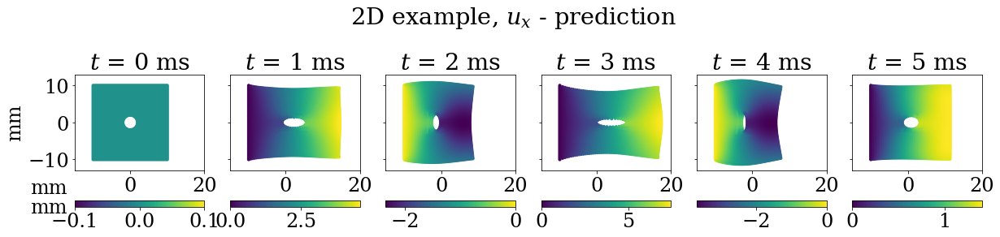

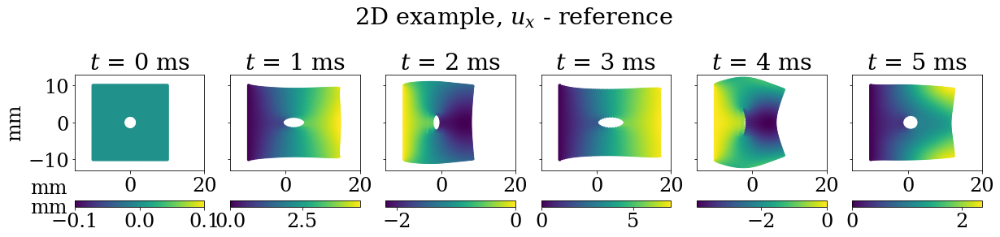

In [11]:
out = evaluate2D(mat1,ridge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,4)

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Ridge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	4
	Training range:	0:300/501


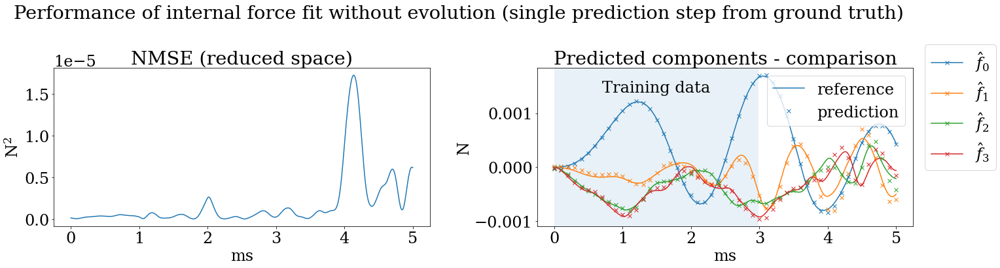

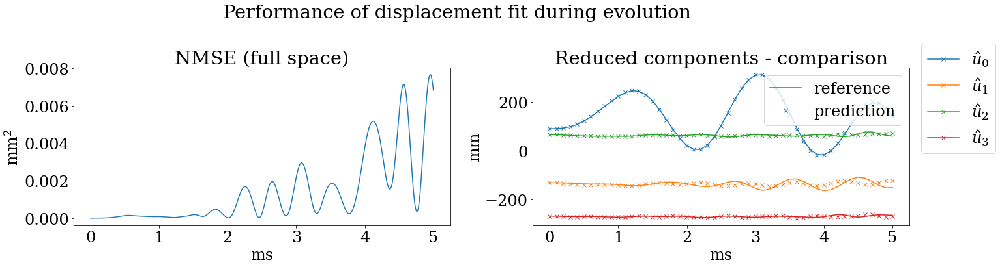

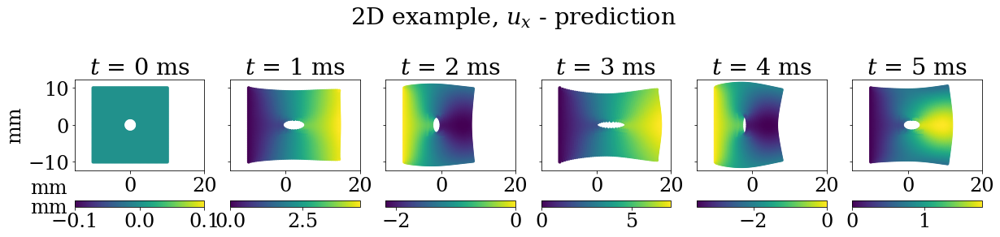

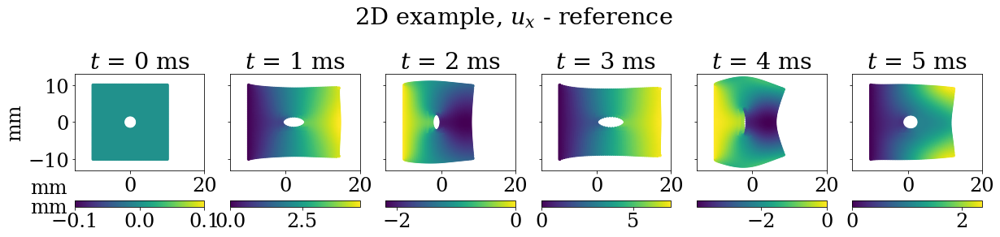

In [17]:
out = evaluate2D(mat1,ridge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,4,training_stop=300)

##### Plastic

Evaluating:
	Training Data:	Example2D(plate/plate_2_20_20)
	Prediction Model:	Ridge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	4
	Training range:	0:300/501


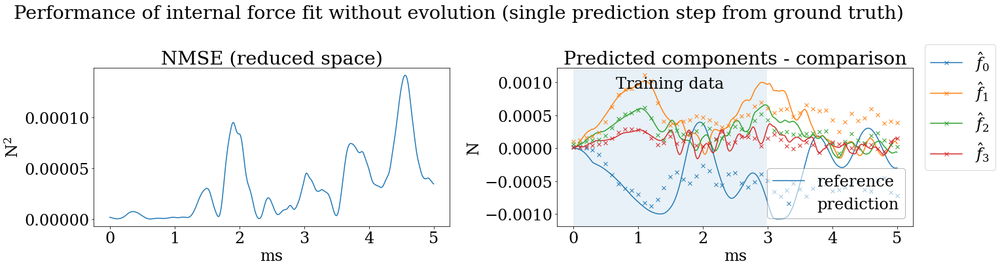

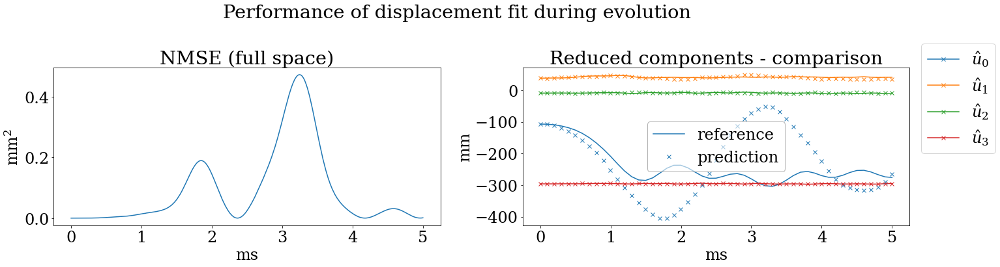

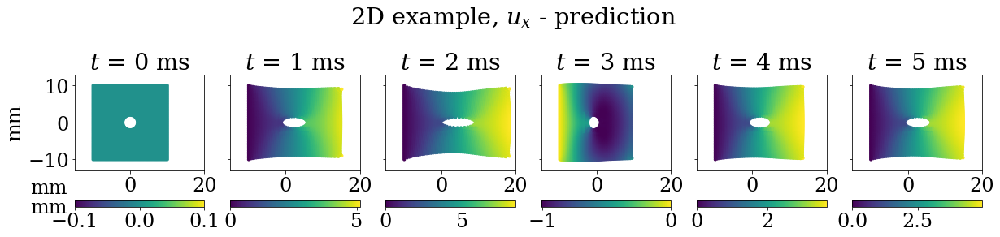

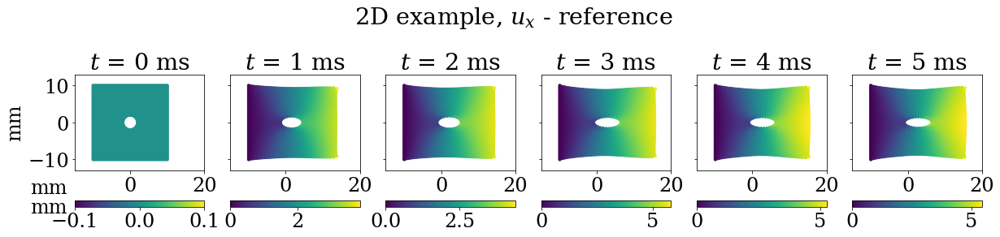

In [20]:
out = evaluate2D(mat2,ridge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,4,training_stop=300)

'Saved to ../animations/plastic_order1_4pods.gif'

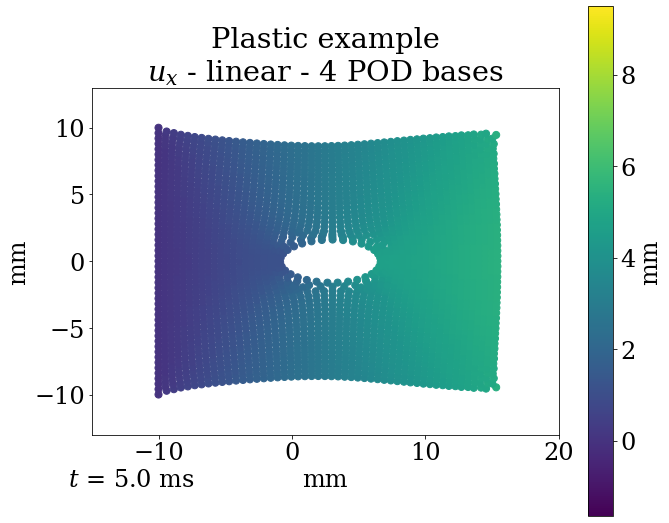

In [21]:
xroutinv = out['xroutinv']
dx_xroutinv = (xroutinv - xroutinv[0])[:,:xroutinv.shape[1]//2]
xx_xroutinv = mat2.xx[0] + xroutinv - xroutinv[0]
animatedplot2D(dx_xroutinv, xx_xroutinv[:,:xx_xroutinv.shape[1]//2],xx_xroutinv[:,xx_xroutinv.shape[1]//2:],
                path = "../animations/plastic_order1_4pods",
                title = "Plastic example\n$u_x$ - linear - 4 POD bases",
                total_frames=100)

#### Non-symmetric, non-regularized, 6 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Ridge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	6
	Training range:	0:501/501


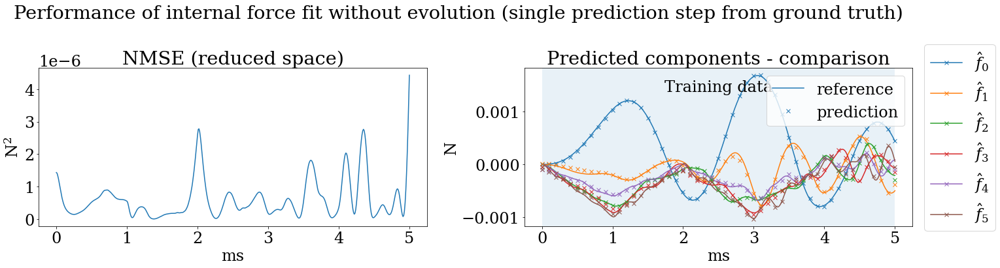

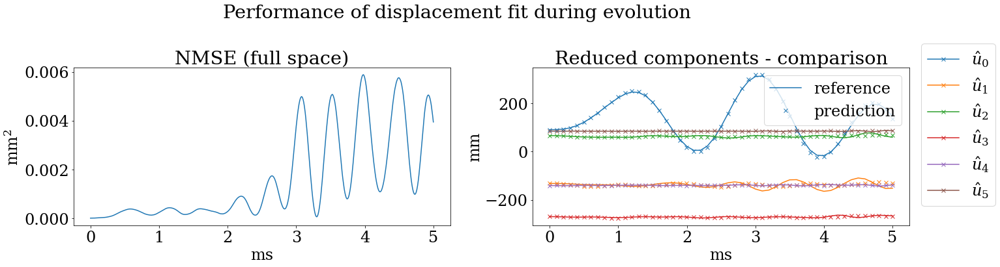

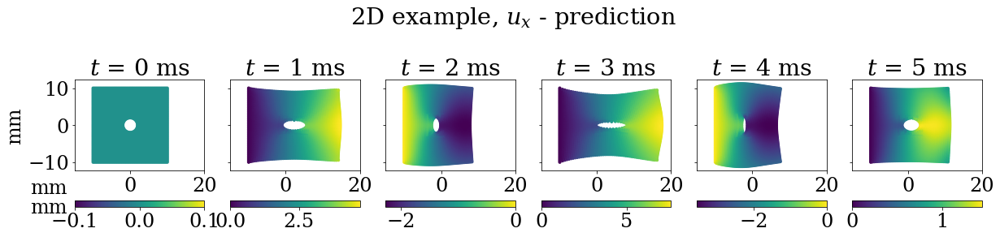

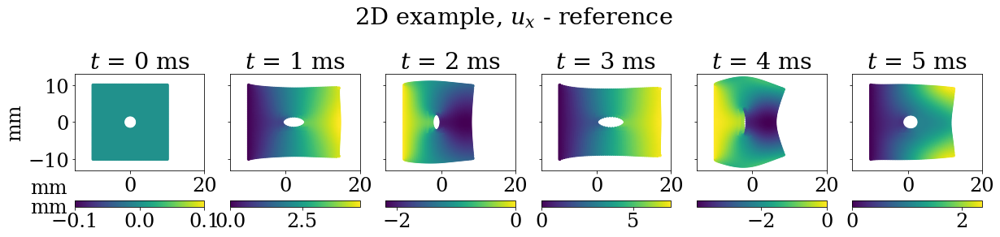

In [18]:
out = evaluate2D(mat1,ridge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,6)

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Ridge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	6
	Training range:	0:300/501


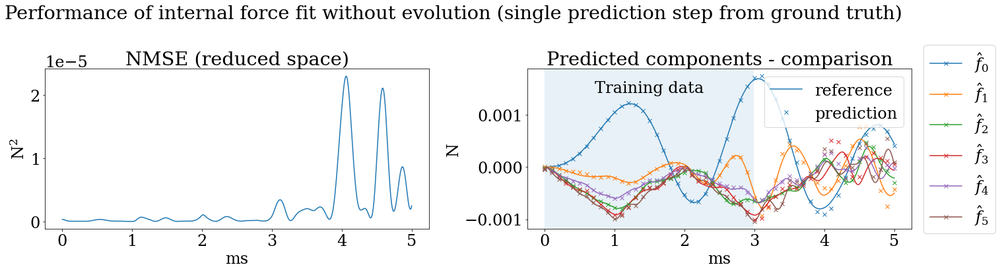

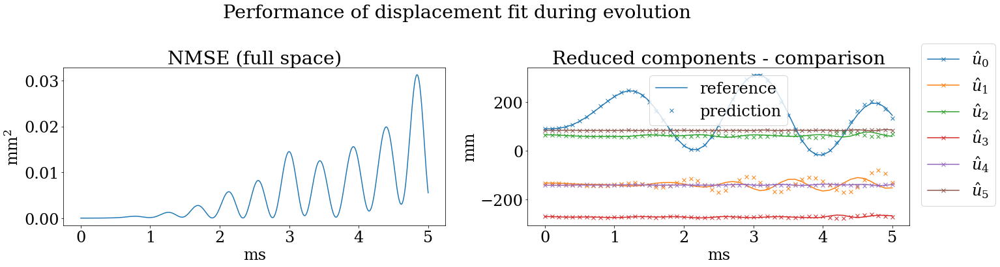

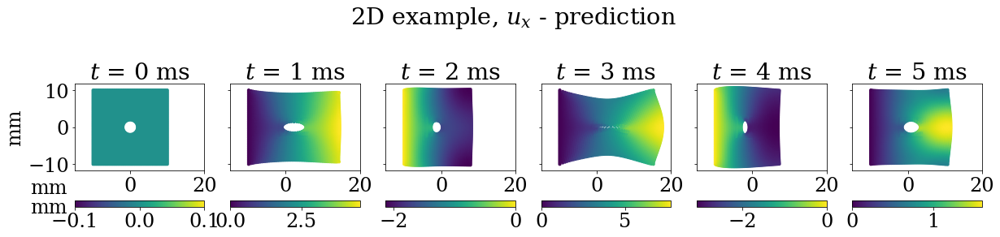

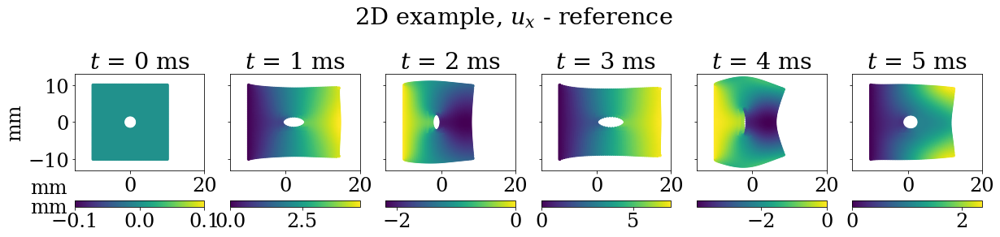

In [19]:
out = evaluate2D(mat1,ridge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,6,training_stop=300)

#### Non-symmetric, non-regularized, 8 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Ridge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	8
	Training range:	0:501/501


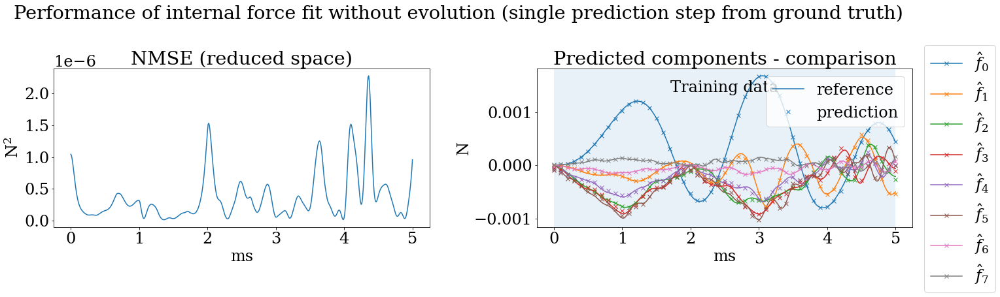

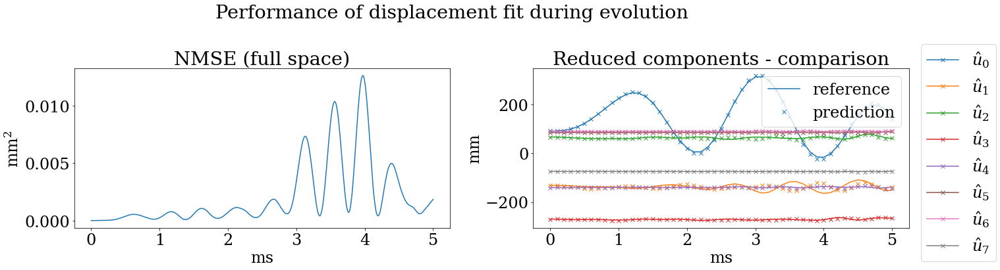

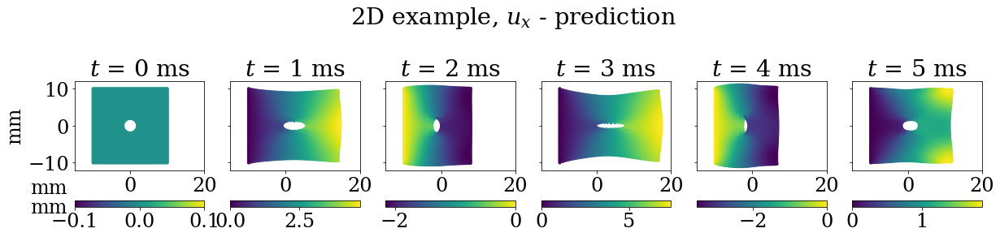

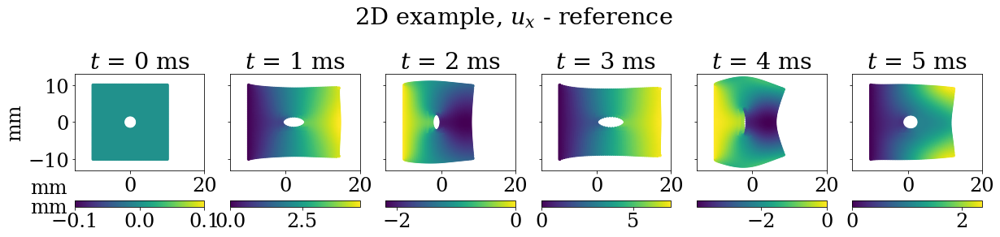

In [20]:
out = evaluate2D(mat1,ridge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,8)

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Ridge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	8
	Training range:	0:300/501


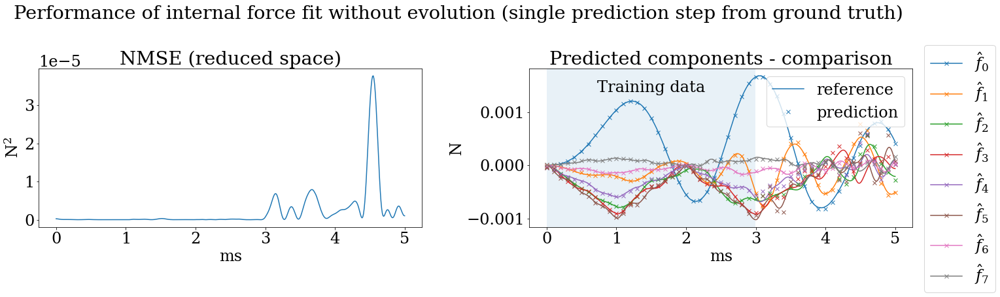

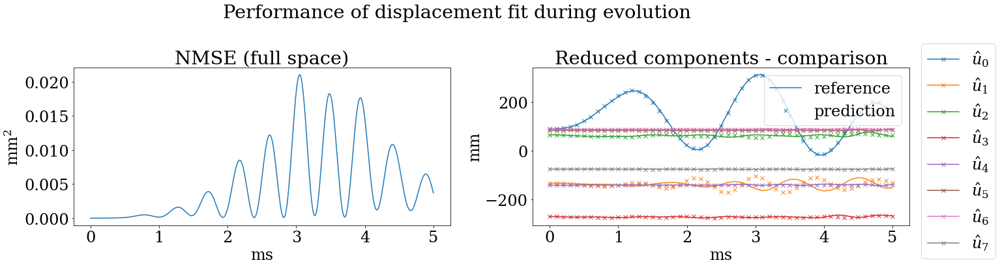

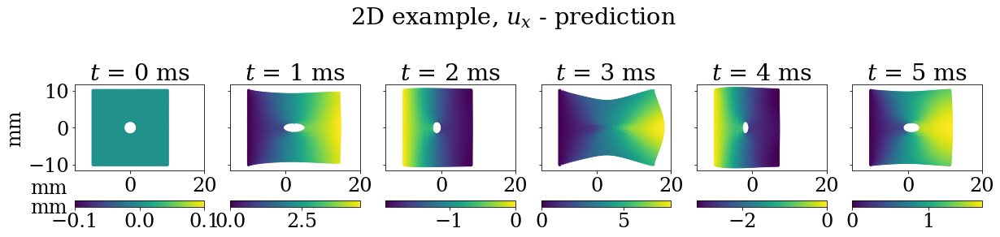

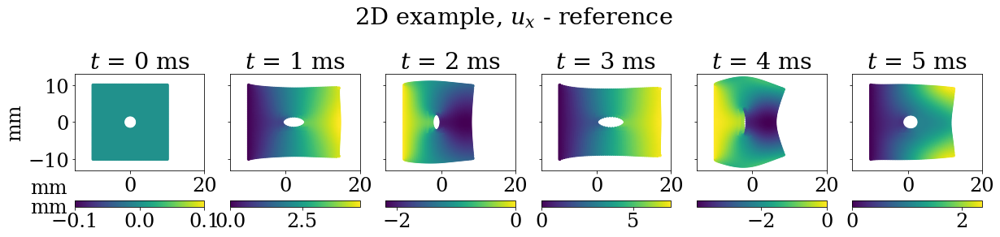

In [21]:
out = evaluate2D(mat1,ridge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,8,training_stop=300)

#### Non-symmetric, non-regularized, 20 POD components

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Ridge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	20
	Training range:	0:300/501


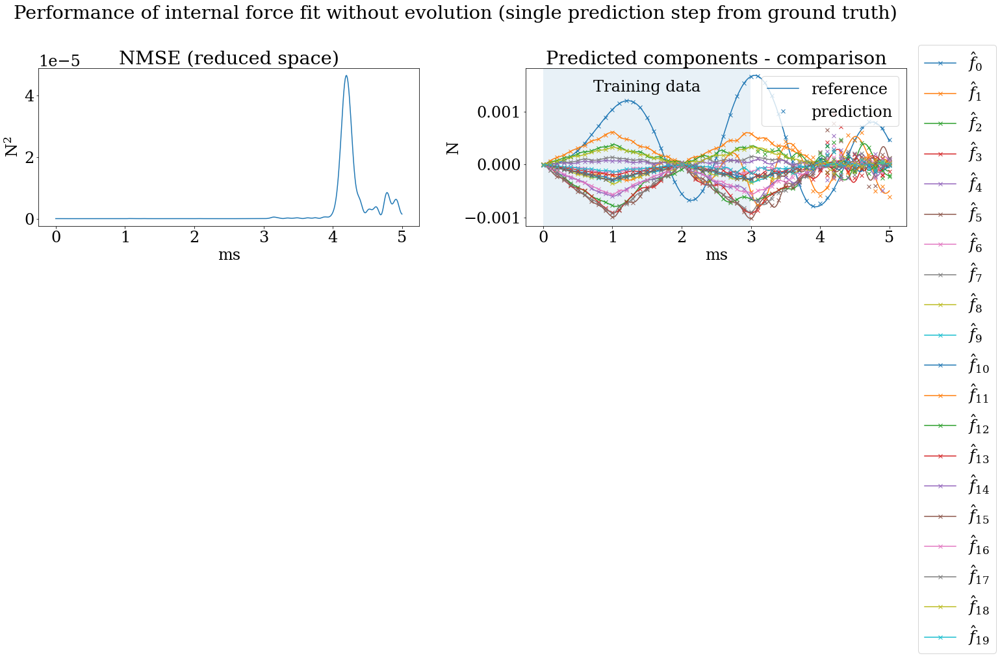

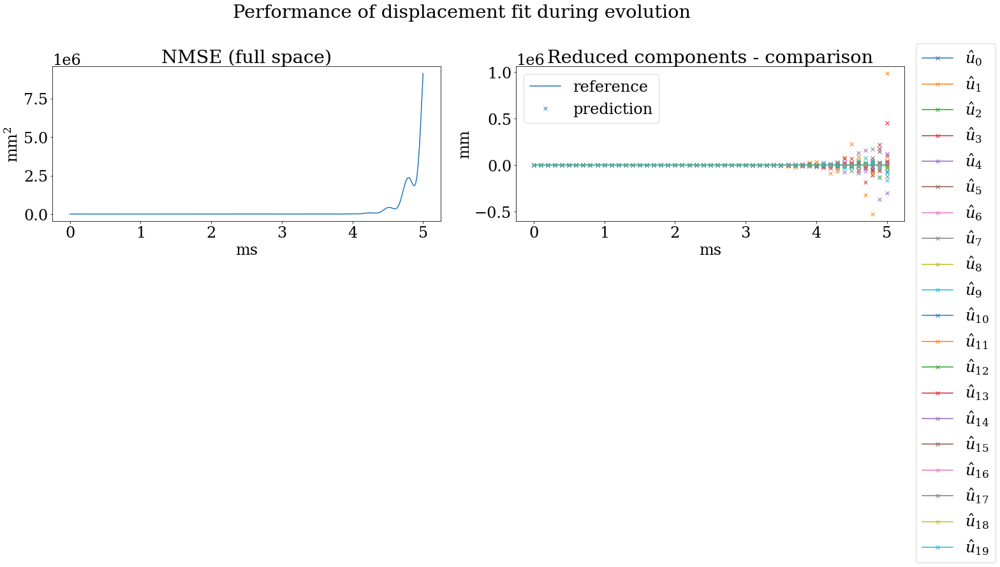

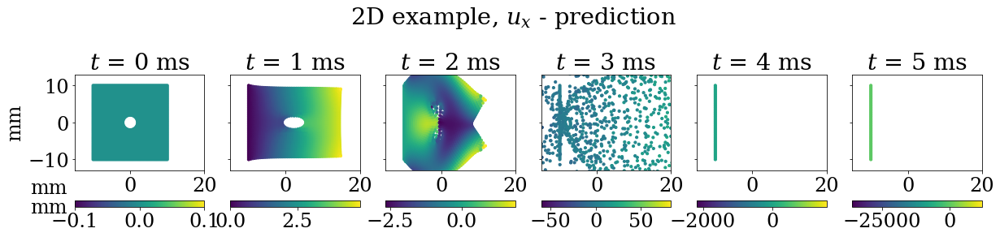

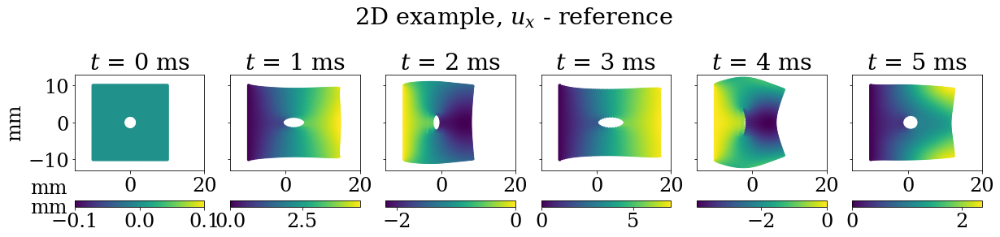

In [85]:
out = evaluate2D(mat1,ridge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,20,training_stop=300)

### Polynomial Regression

In [12]:
polyRidge = make_pipeline(MonomialFeatures(3), Ridge(alpha=0))
polyRidgeReg1 = make_pipeline(MonomialFeatures(3), Ridge(alpha=1))
polyRidgeReg10 = make_pipeline(MonomialFeatures(3), Ridge(alpha=10))
polyRidgeScaledReg = make_pipeline(MaxAbsScaler(),MonomialFeatures(3),Ridge(alpha=1))
polyRidgeScaledReg10 = make_pipeline(MaxAbsScaler(),MonomialFeatures(3),Ridge(alpha=10))

#### Non-symmetric, non-regularized, 4 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Pipeline(steps=[('monomialfeatures', MonomialFeatures(degree=3)),
                ('ridge', Ridge(alpha=0))])(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	4
	Training range:	0:501/501


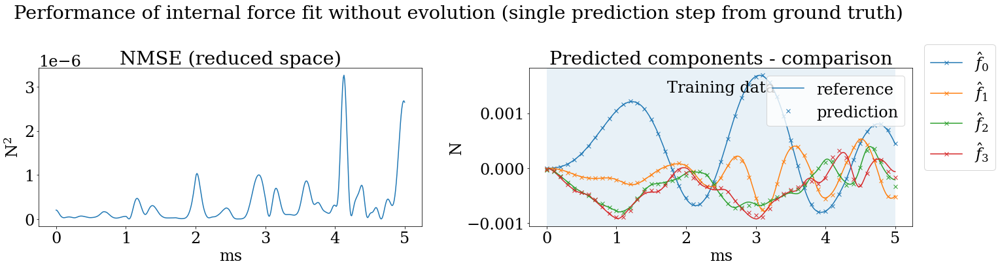

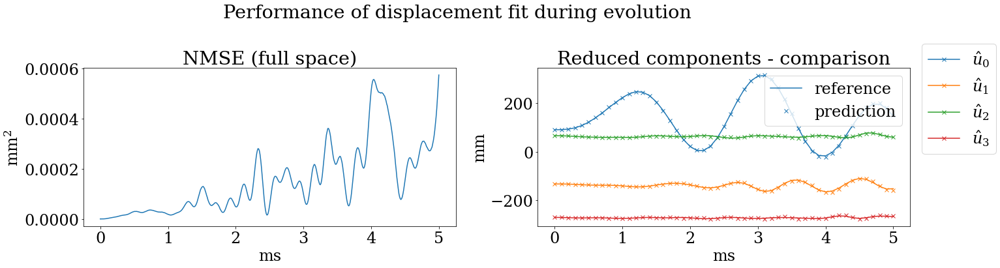

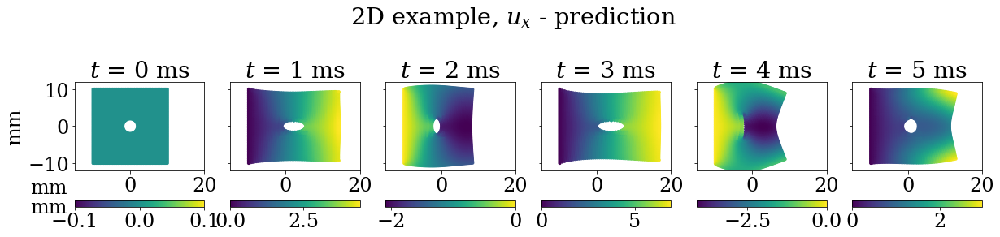

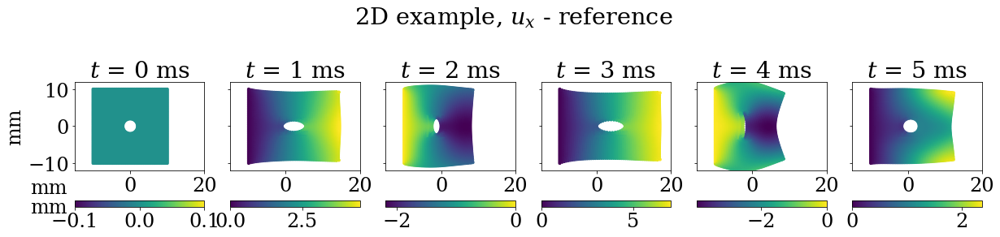

In [42]:
out = evaluate2D(mat1,polyRidge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,4)

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Pipeline(steps=[('monomialfeatures', MonomialFeatures(degree=3)),
                ('ridge', Ridge(alpha=0))])(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	4
	Training range:	0:300/501


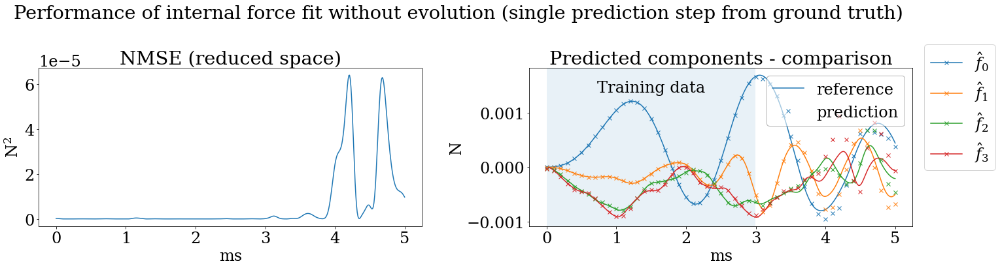

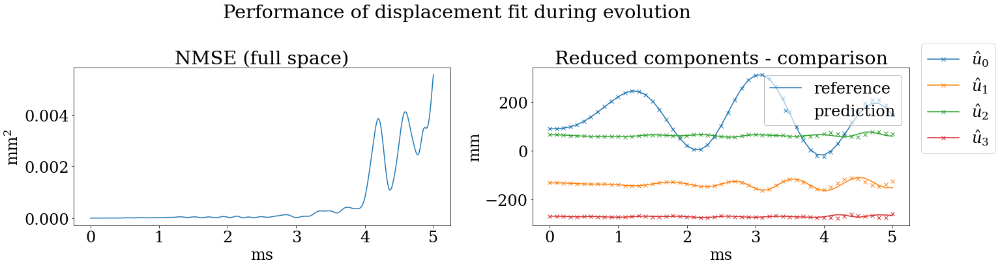

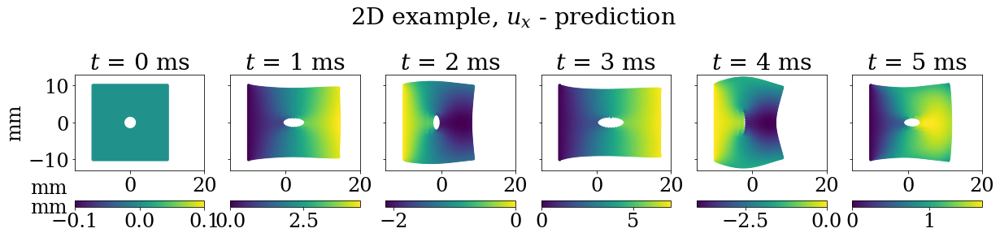

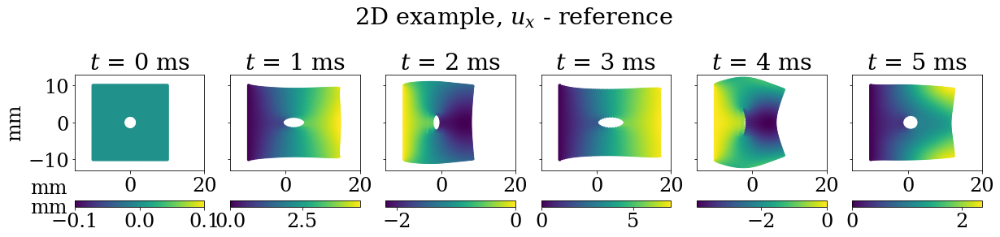

In [13]:
out = evaluate2D(mat1,polyRidge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,4,pod_ratio=False,training_stop=300)

'Saved to ../animations/hyperelastic_order3_4pods.gif'

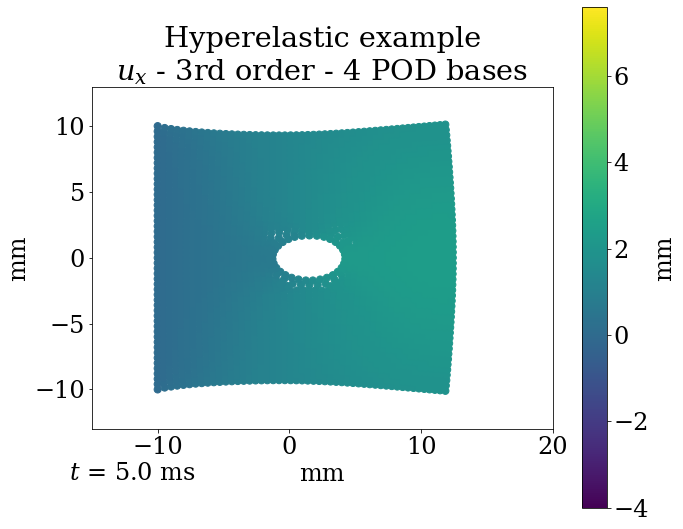

In [14]:
xroutinv = out['xroutinv']
dx_xroutinv = (xroutinv - xroutinv[0])[:,:xroutinv.shape[1]//2]
xx_xroutinv = mat1.xx[0] + xroutinv - xroutinv[0]
animatedplot2D(dx_xroutinv, xx_xroutinv[:,:xx_xroutinv.shape[1]//2],xx_xroutinv[:,xx_xroutinv.shape[1]//2:],
                path = "../animations/hyperelastic_order3_4pods",
                title = "Hyperelastic example\n$u_x$ - 3rd order - 4 POD bases",
               total_frames=100)

##### Plastic

Evaluating:
	Training Data:	Example2D(plate/plate_2_20_20)
	Prediction Model:	Pipeline(steps=[('monomialfeatures', MonomialFeatures(degree=3)),
                ('ridge', Ridge(alpha=0))])(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	4
	Training range:	0:501/501
ValueError during prediction at i=133: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=134: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=135: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=136: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=137: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
P

d:\Documents\TUM\thesis\ansys-misc\evaluate.py:146: RuntimeWarning: overflow encountered in square
  nmse = ((mat.xx-xx_xroutinv)**2).mean(axis=1)/(mat.xx.max()-mat.xx.min())


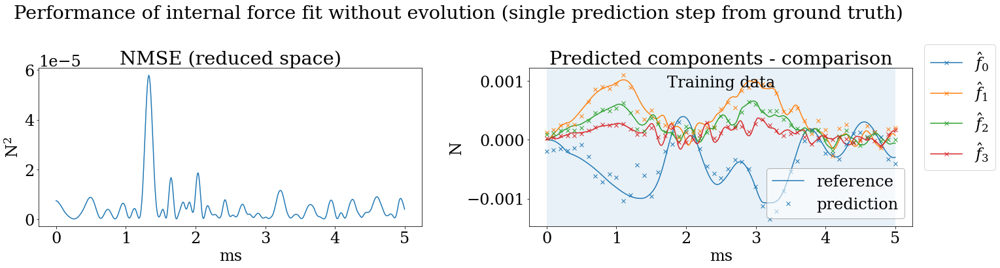

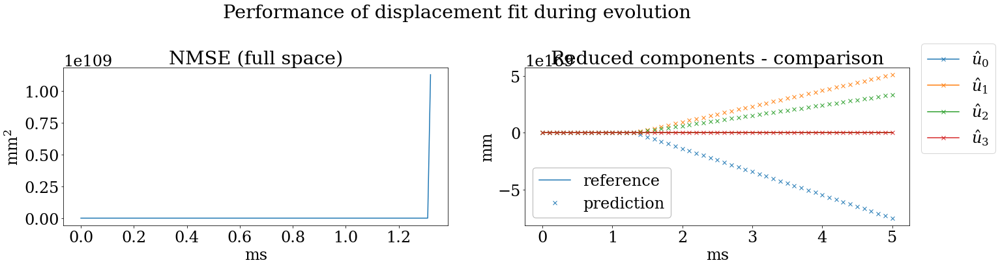

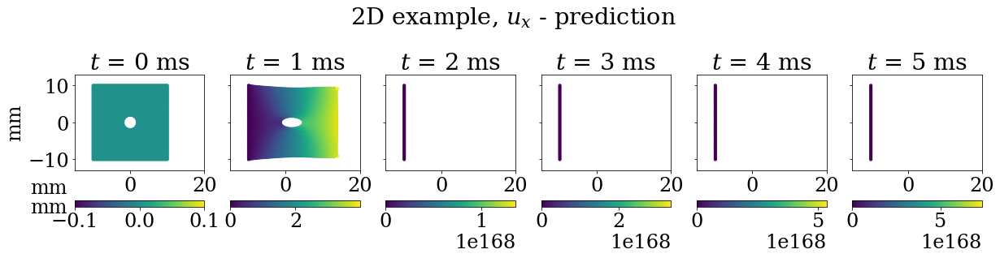

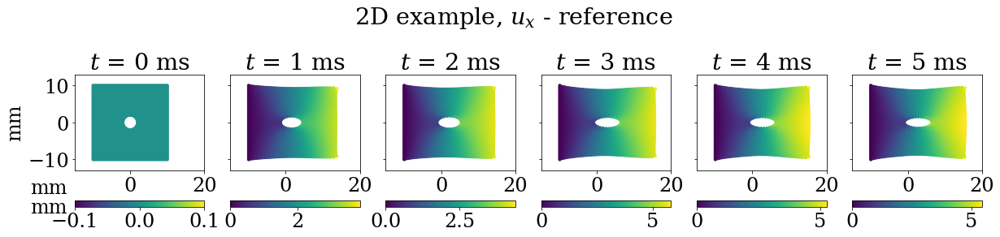

In [17]:
out = evaluate2D(mat2,polyRidge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,4)

#### Non-symmetric, non-regularized, 6 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Pipeline(steps=[('monomialfeatures', MonomialFeatures(degree=3)),
                ('ridge', Ridge(alpha=0))])(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	6
	Training range:	0:501/501
ValueError during prediction at i=470: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=471: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=472: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=473: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=474: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
P

d:\Documents\TUM\thesis\ansys-misc\evaluate.py:118: RuntimeWarning: overflow encountered in square
  plt.plot(mat.t,((mat.xx-xx_xroutinv)**2).mean(axis=1)/(mat.xx.max()-mat.xx.min()))


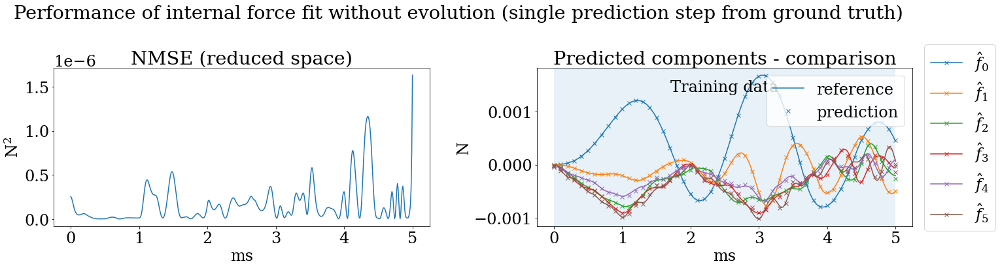

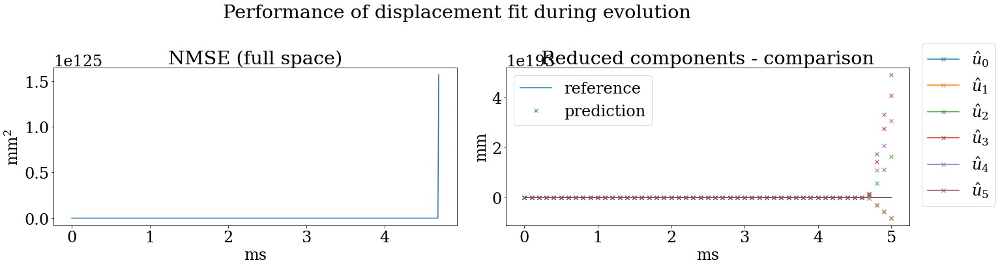

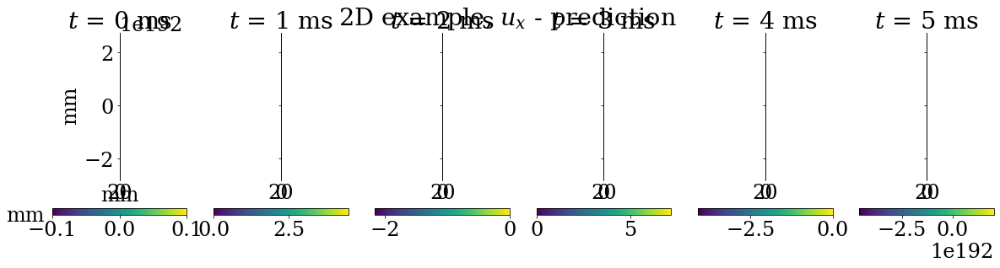

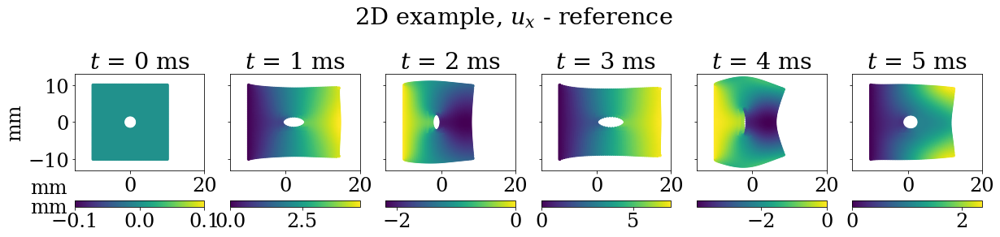

In [29]:
out = evaluate2D(mat1,polyRidge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,6,)

#### Non-symmetric, regularized, 4 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Pipeline(steps=[('maxabsscaler', MaxAbsScaler()),
                ('monomialfeatures', MonomialFeatures(degree=3)),
                ('ridge', Ridge(alpha=1))])(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	4
	Training range:	0:300/501


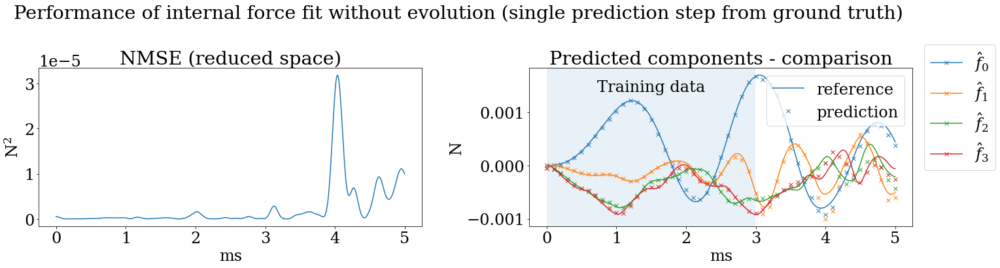

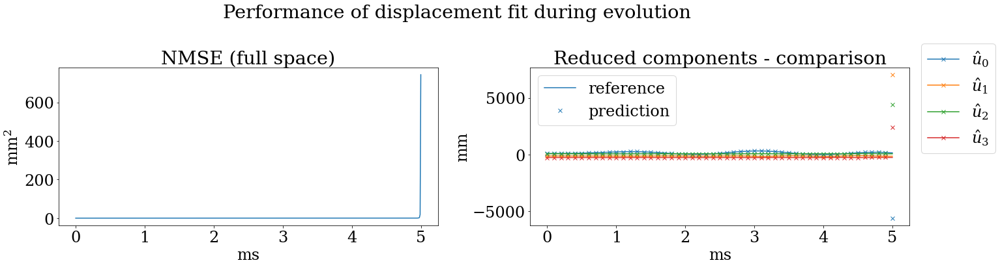

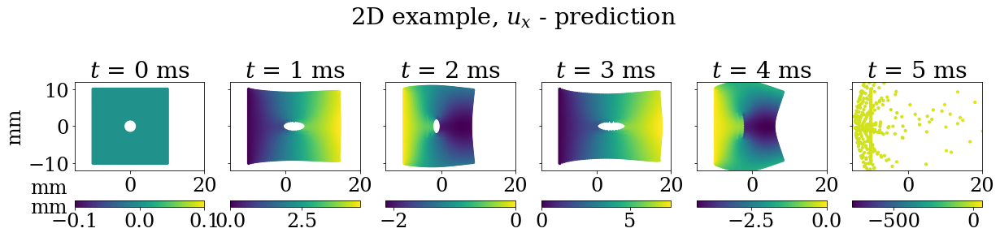

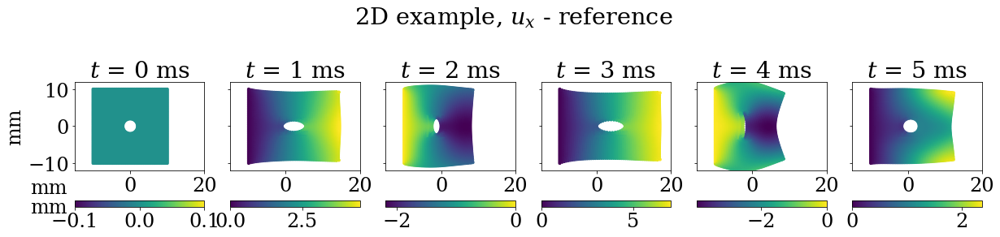

In [41]:
out = evaluate2D(mat1,polyRidgeScaledReg,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,4,training_stop=300)

#### Non-symmetric, regularized, 6 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Pipeline(steps=[('maxabsscaler', MaxAbsScaler()),
                ('monomialfeatures', MonomialFeatures(degree=3)),
                ('ridge', Ridge(alpha=1))])(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	6
	Training range:	0:501/501


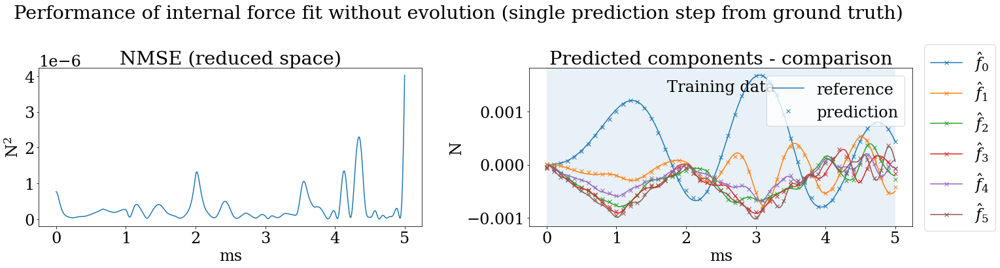

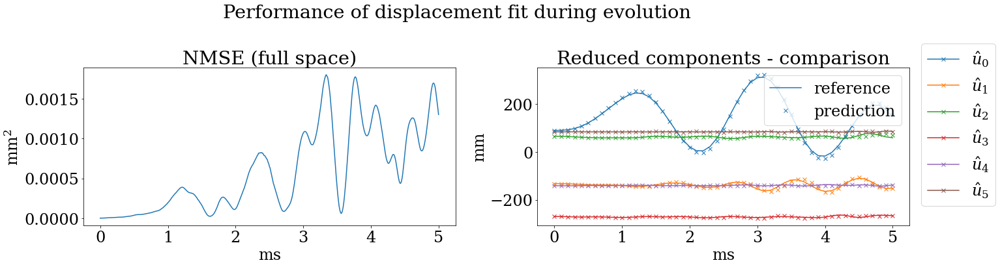

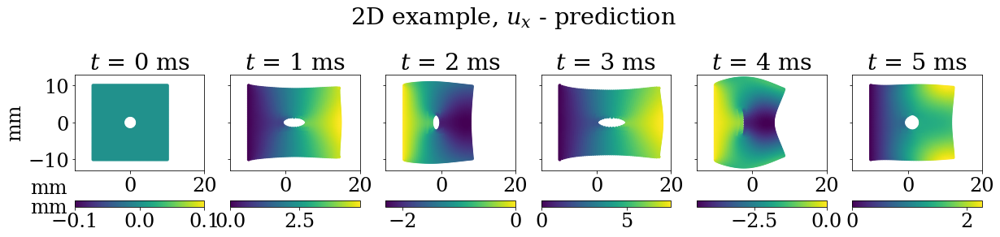

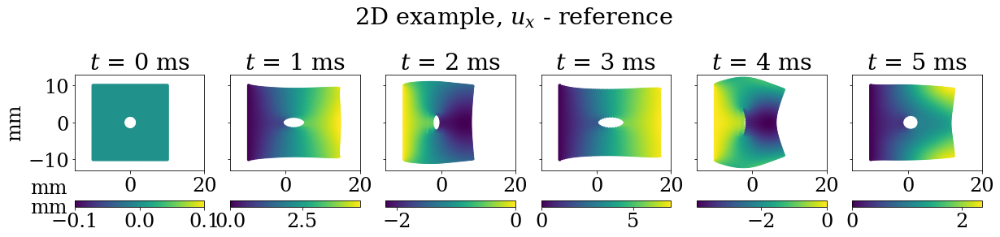

In [75]:
out = evaluate2D(mat1,polyRidgeScaledReg,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,6)

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	Pipeline(steps=[('maxabsscaler', MaxAbsScaler()),
                ('monomialfeatures', MonomialFeatures(degree=3)),
                ('ridge', Ridge(alpha=1))])(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement with interpolation of applied force
	POD components:	6
	Training range:	0:300/501
ValueError during prediction at i=2232: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=2233: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=2234: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=2235: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during predict

d:\Documents\TUM\thesis\ansys-misc\evaluate.py:122: RuntimeWarning: overflow encountered in square
  plt.plot(mat.t,((mat.xx-xx_xroutinv)**2).mean(axis=1)/(mat.xx.max()-mat.xx.min()))


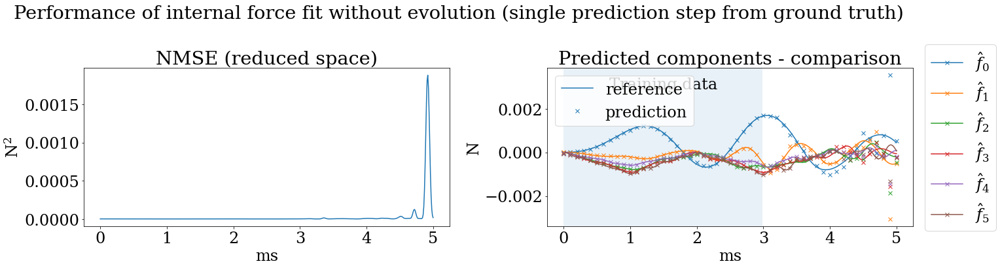

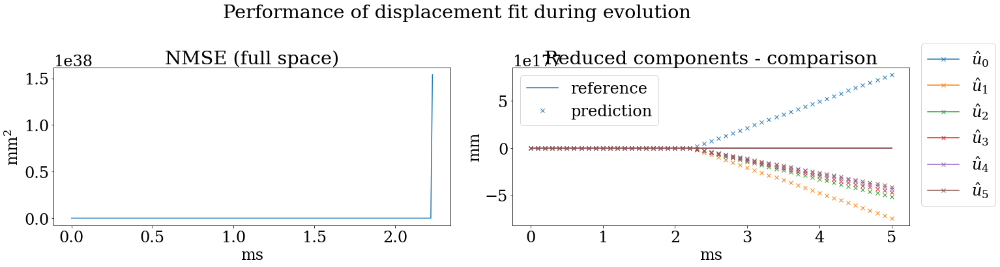

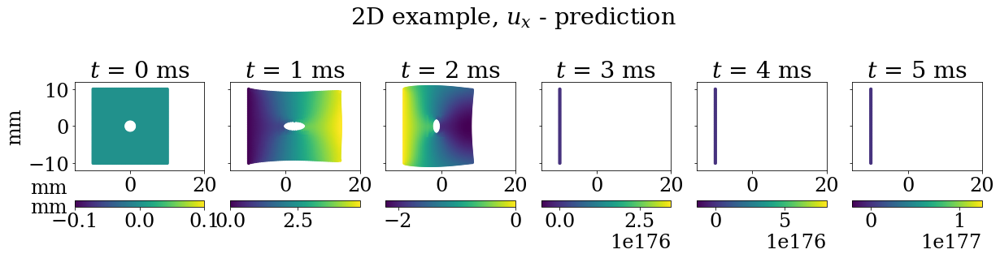

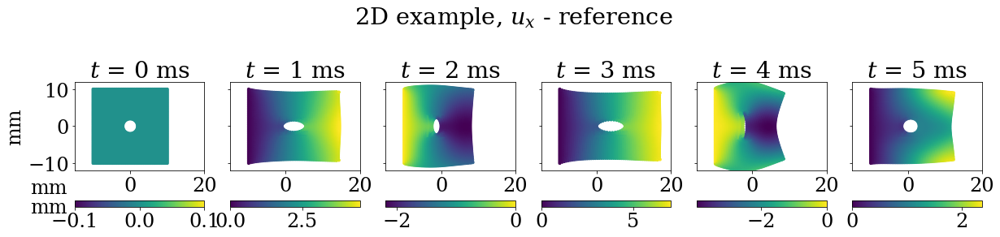

In [74]:
out = evaluate2D(mat1,polyRidgeScaledReg,dr_trainfunc, dr_trainfunc, dr_arinterp_predfunc,6,training_stop=300,dt=1e-3)

### Symmetric Regression

In [80]:
symRidge = SymmetricRidge(alpha=0)


#### Linear, non-regularized, 4 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	SymmetricRidge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	4
	Training range:	0:300/501


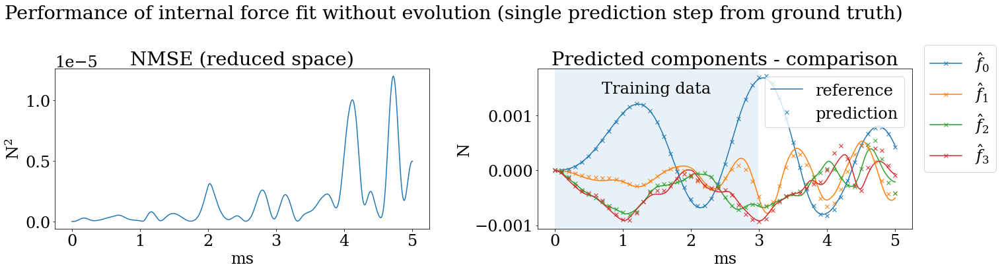

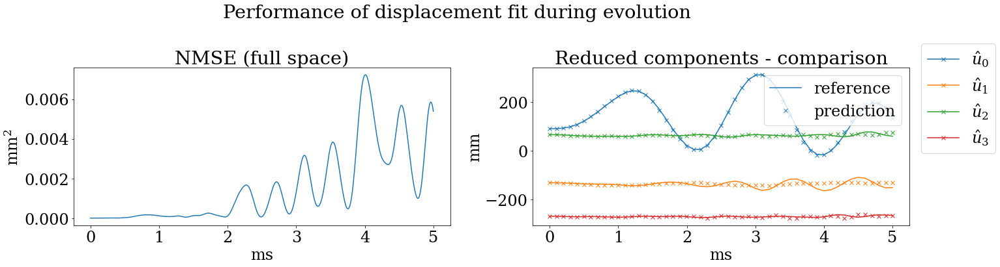

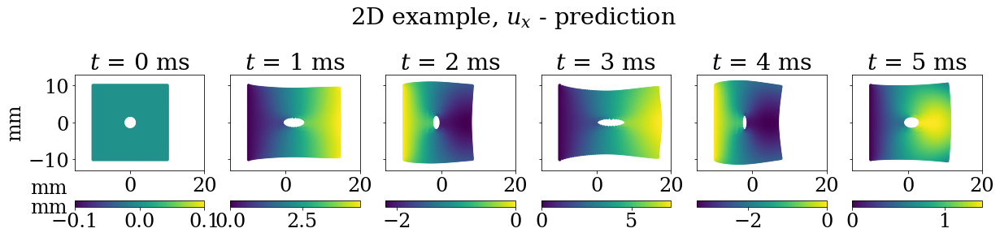

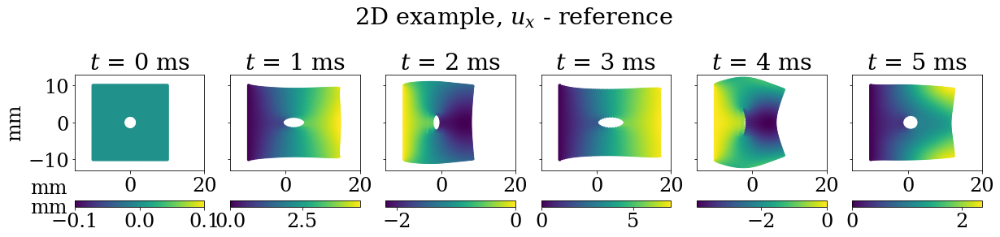

In [91]:
out = evaluate2D(mat1,symRidge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,4,pod_ratio=False,training_stop=300)

#### Linear, non-regularized, 20 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	SymmetricRidge(alpha=0)(Reduced displacement, Reduced Internal force)
	Acceleration function:	Prediction from displacement
	POD components:	20
	Training range:	0:300/501


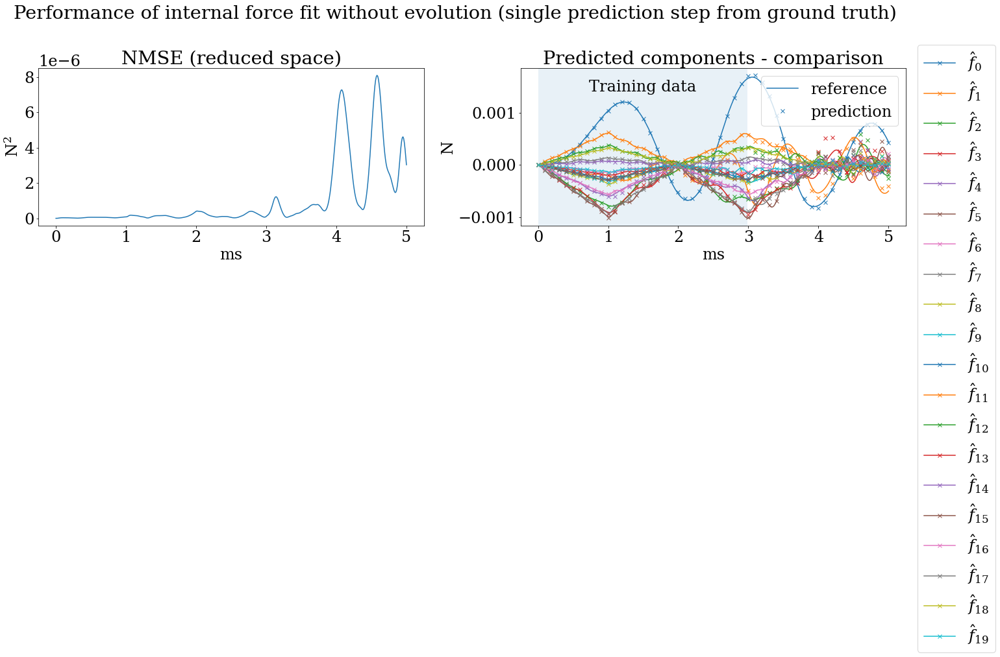

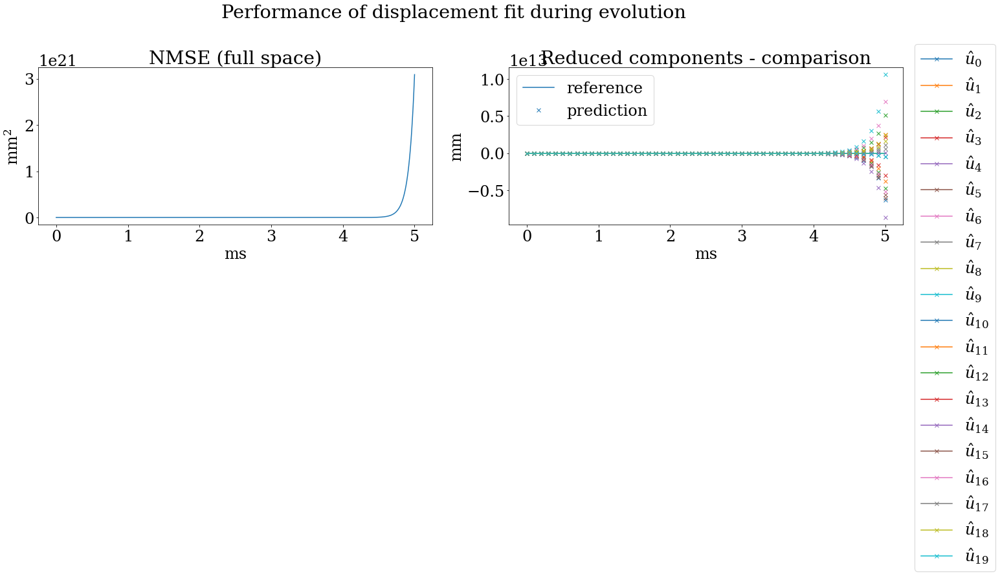

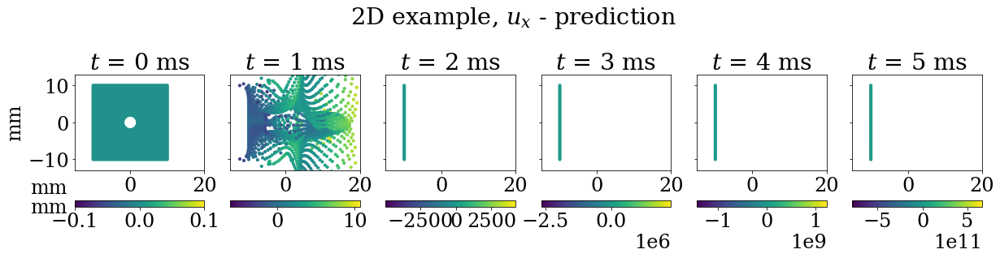

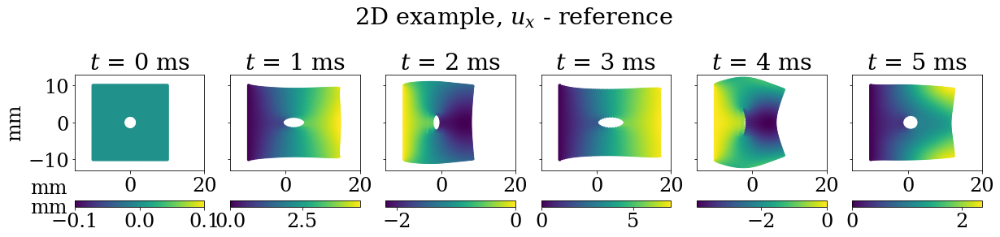

In [86]:
out = evaluate2D(mat1,symRidge,dr_trainfunc, dr_trainfunc, dr_ar_predfunc,20,training_stop=300)

#### More helper functions

In [62]:
def drlift_trainfunctf_base(mat,stop=501):
    return MonomialFeatures(3).fit_transform(mat.xr[:stop] - mat.xr[0]) , mat.fint_r[:stop]

drlift_trainfunctf = NamedFunc(drlift_trainfunctf_base,'Reduced displacement with polynomial 3rd order lifting adapted to tensorflow')

def drlift_ar_predfunctf_base(i,x,v,mat,model,Mrinv,hist): 
    try:
            fint_r_pred = model.predict(MonomialFeatures(3).fit_transform((x.reshape(1,-1)-mat.xr[0]).reshape(1,-1)))
    except ValueError as e:
            print(f"ValueError during prediction at i={i}: '{e}'.\nPredicting a=0 instead.")
            fint_r_pred = mat.far[i]
    fr = mat.far[i]
    ar_pred = Mrinv @  (fr - fint_r_pred).T
    return ar_pred.T

drlift_ar_predfunctf = NamedFunc(drlift_ar_predfunctf_base, 'Prediction from displacement with polynomial 3rd order lifting adapted to tensorflow')

#### Polynomial, non-regularized, 4 POD bases

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	<keras.engine.sequential.Sequential object at 0x0000027CBBD042B0>(Reduced displacement with polynomial 3rd order lifting adapted to tensorflow, Reduced Internal force)
	Acceleration function:	Prediction from displacement with polynomial 3rd order lifting adapted to tensorflow
	POD components:	4
	Training range:	0:300/501
      0/Unknown - 3s 0s/sample - loss: 2.1640e-08Epoch 100/1000
1000/1000 [==============================] - 0s 30us/sample - loss: 2.6647e-08


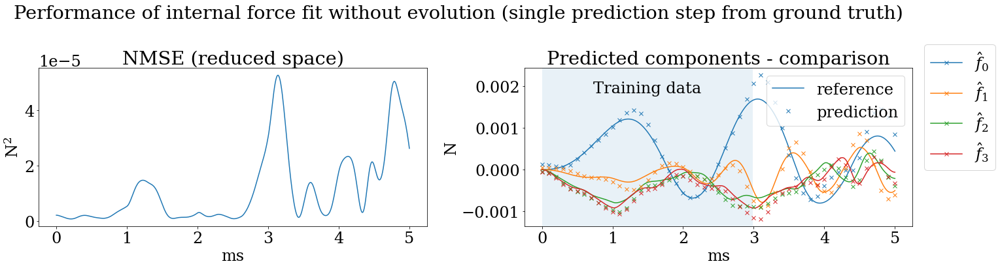

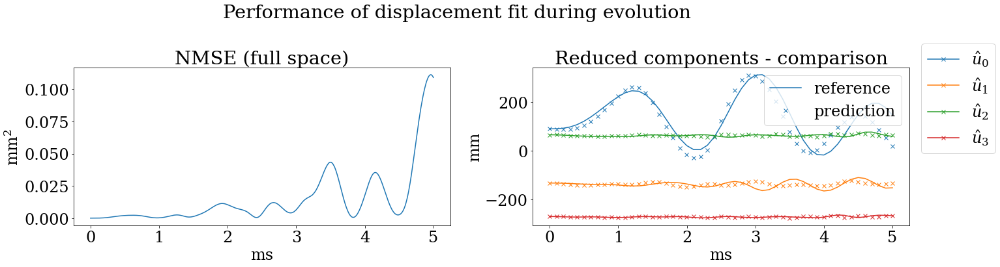

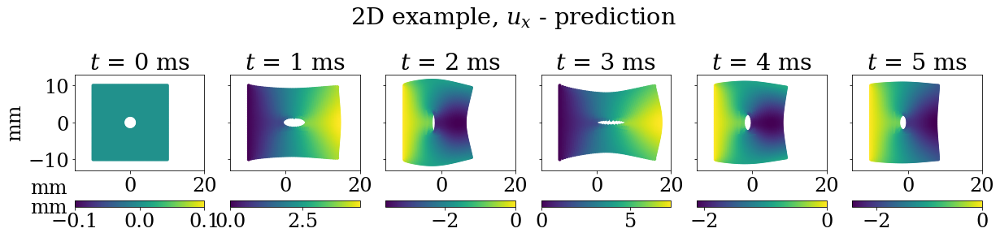

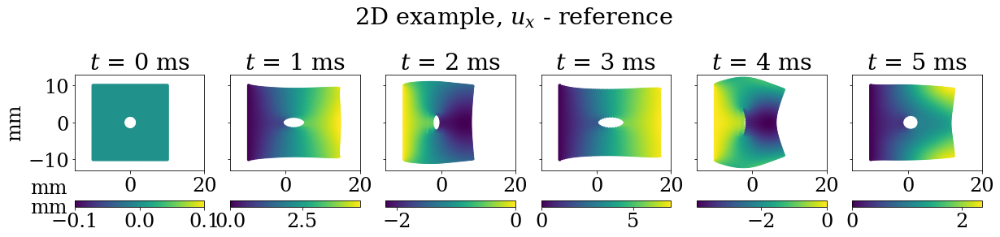

In [46]:
tf.random.set_seed(0)
best = SaveBest()
fit_params = dict(verbose=1, epochs=1000,batch_size=32, callbacks=[EpochProgbar(skip_epochs=100),])
out = evaluate2D(mat1,tfNSymmetricBuiltin_NormRegressor(4,learning_rate=1.0),drlift_trainfunctf, drlift_trainfunctf, drlift_ar_predfunctf,4,training_stop=300,fit_params=fit_params)

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	<keras.engine.sequential.Sequential object at 0x0000027CE2857EB0>(Reduced displacement with polynomial 3rd order lifting adapted to tensorflow, Reduced Internal force)
	Acceleration function:	Prediction from displacement with polynomial 3rd order lifting adapted to tensorflow
	POD components:	4
	Training range:	0:300/501
      0/Unknown - 7s 0s/sample - loss: 5.1049e-08Epoch 100/1000
800/800 [==============================] - 0s 64us/sample - loss: 3.0563e-07 - val_loss: 6.9916e-07
ValueError during prediction at i=293: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=294: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=295: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during pre

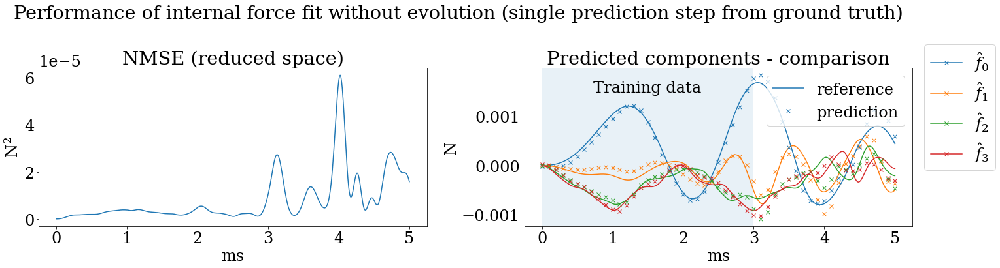

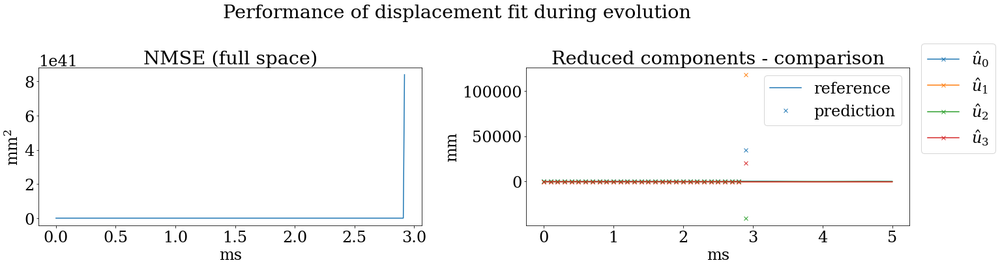

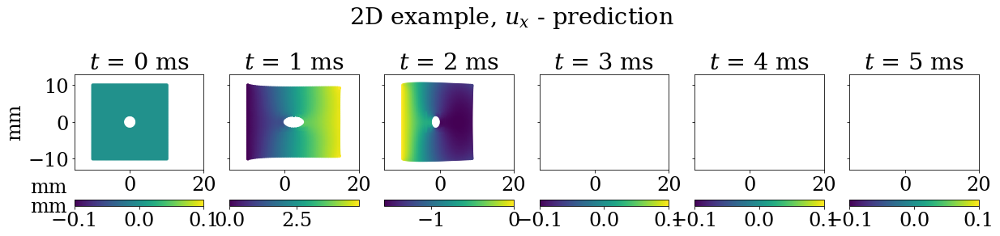

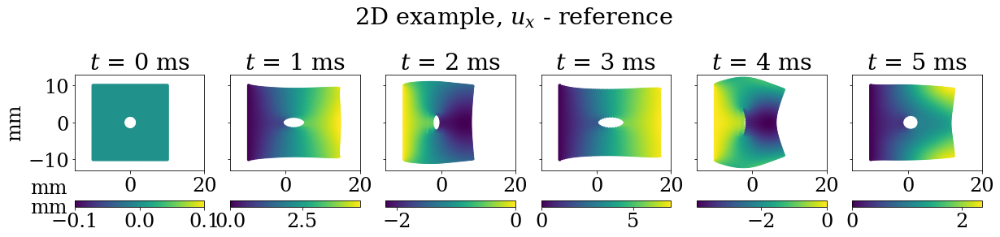

In [62]:
tf.random.set_seed(0)
best = SaveBest()
fit_params = dict(verbose=1, epochs=1000,batch_size=32, validation_split=0.25, callbacks=[EpochProgbar(skip_epochs=100),best])
out = evaluate2D(mat1,tfNSymmetricBuiltin_NormRegressor(4,learning_rate=1.0),drlift_trainfunctf, drlift_trainfunctf, drlift_ar_predfunctf,4,training_stop=300,fit_params=fit_params,save_best=best)

Evaluating:
	Training Data:	Example2D(plate/plate_1_20_20)
	Prediction Model:	<keras.engine.sequential.Sequential object at 0x0000027CBB926640>(Reduced displacement with polynomial 3rd order lifting adapted to tensorflow, Reduced Internal force)
	Acceleration function:	Prediction from displacement with polynomial 3rd order lifting adapted to tensorflow
	POD components:	4
	Training range:	0:300/501
      0/Unknown - 4s 0s/sample - loss: 1.5203e-09Epoch 100/1000
  0/200 [..............................] - ETA: 0s - loss: 7.0622e-10 - val_loss: 7.8210e-09ValueError during prediction at i=439: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=440: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=441: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction 

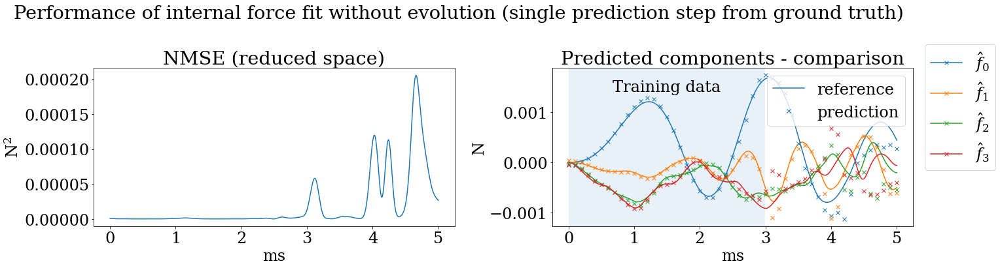

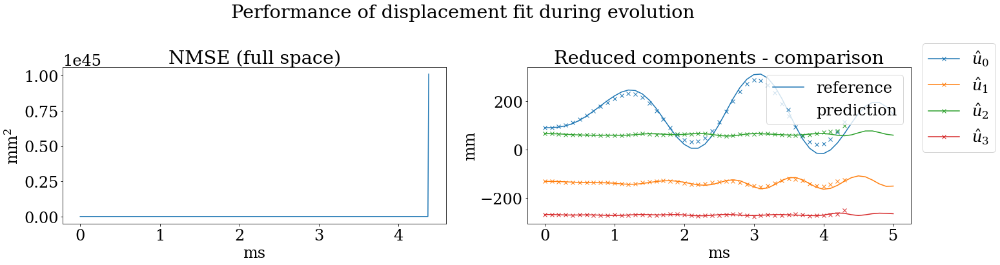

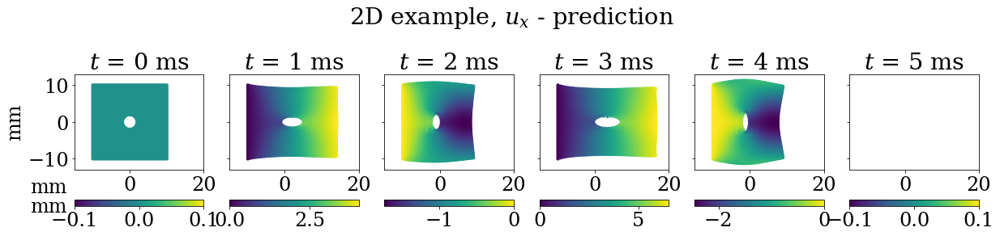

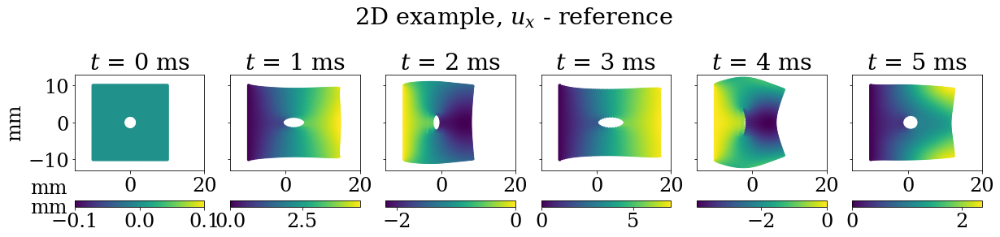

In [66]:
tf.random.set_seed(0)
best = SaveBest()
fit_params = dict(verbose=1, epochs=1000,batch_size=128, validation_split=0.25, callbacks=[EpochProgbar(skip_epochs=100),tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=25)])
out = evaluate2D(mat1,tfNSymmetricBuiltin_NormRegressor(4,learning_rate=1.0),drlift_trainfunctf, drlift_trainfunctf, drlift_ar_predfunctf,4,training_stop=300,fit_params=fit_params)

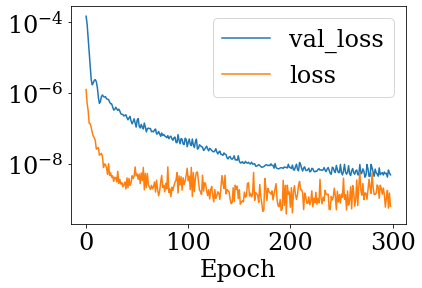

In [69]:
plt.semilogy(out['fit_history'].history['val_loss'], label='val_loss')
plt.semilogy(out['fit_history'].history['loss'], label="loss")
plt.xlabel("Epoch")
plt.legend();

Plastic

Evaluating:
	Training Data:	Example2D(plate/plate_2_20_20)
	Prediction Model:	<keras.engine.sequential.Sequential object at 0x0000018B9A438C10>(Reduced displacement with polynomial 3rd order lifting adapted to tensorflow, Reduced Internal force)
	Acceleration function:	Prediction from displacement with polynomial 3rd order lifting adapted to tensorflow
	POD components:	4
	Training range:	0:500/501
      0/Unknown - 4s 0s/sample - loss: 2.1533e-08Epoch 100/1000
100/100 [==============================] - 0s 460us/sample - loss: 1.1347e-08 - val_loss: 1.7289e-08
ValueError during prediction at i=132: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=133: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during prediction at i=134: 'Input contains NaN, infinity or a value too large for dtype('float64').'.
Predicting a=0 instead.
ValueError during pr

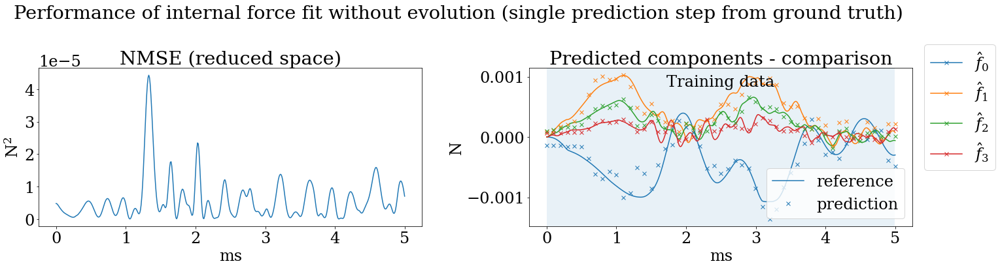

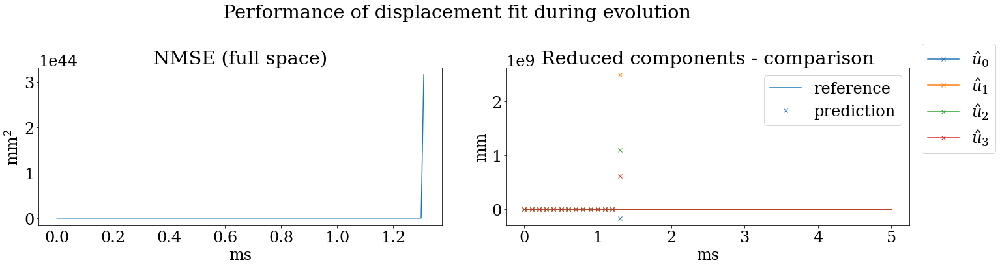

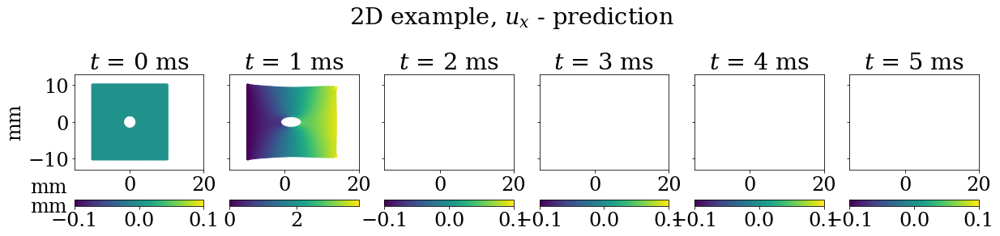

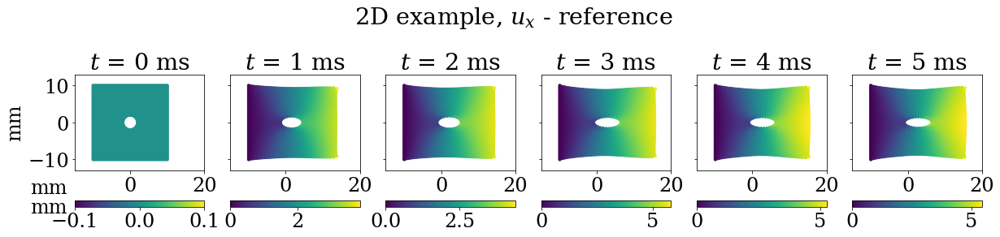

In [74]:
tf.random.set_seed(0)
best = SaveBest()
fit_params = dict(verbose=1, epochs=1000,batch_size=450, validation_split=0.1, callbacks=[EpochProgbar(skip_epochs=100),best])
out = evaluate2D(mat2,tfNSymmetricBuiltin_NormRegressor(4,learning_rate=1.0),drlift_trainfunctf, drlift_trainfunctf, drlift_ar_predfunctf,4,training_stop=500,fit_params=fit_params, save_best=best)